# Continuation of Group_F_3rdCase_Code2_DataPrep notebook
In the previous notebook these steps were done:
- Data Exploration
- Data Pre-Processing

# Initial setup and modules/packages loading

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

#Clustering
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram

#Recommender System
#MBA and Apriori
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

#Page Rank
# from numpy import *
# # import numpy as np
from numpy import dot, linalg, array, eye, ones, real
from scipy.sparse import csr_matrix
from numpy.linalg import norm
import networkx as nx
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics.pairwise import cosine_similarity
from scipy import sparse

# !pip install scikit-surprise
import surprise
from surprise import Dataset, Reader
from surprise.model_selection import ShuffleSplit
from surprise.model_selection import train_test_split
from surprise import SVD
from surprise import accuracy
from sklearn.model_selection import GridSearchCV
from surprise.model_selection import GridSearchCV
from surprise.model_selection import cross_validate
from surprise import Dataset, Reader

#Clustering
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm

# Load the code

In [2]:
# Read CSV into DataFrame
client_transactions = pd.read_csv('client_transactions.csv')
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0


# Modeling 

First check again the dataframe, if there are missing values and its variables and data types.

In [3]:
# Check for missing values in the DataFrame
missing_values = client_transactions.isna().sum()

# Display the count of missing values for each column
print(missing_values)

ID Product                 0
Product Description        0
ID Product Category        0
Date                       0
Client ID                  0
ID Client Type             0
Client Type Description    0
Day of Week                0
Location                   0
Season                     0
Week Value                 0
dtype: int64


In [4]:
client_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 233170 entries, 0 to 233169
Data columns (total 11 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ID Product               233170 non-null  int64  
 1   Product Description      233170 non-null  object 
 2   ID Product Category      233170 non-null  object 
 3   Date                     233170 non-null  object 
 4   Client ID                233170 non-null  int64  
 5   ID Client Type           233170 non-null  int64  
 6   Client Type Description  233170 non-null  object 
 7   Day of Week              233170 non-null  int64  
 8   Location                 233170 non-null  object 
 9   Season                   233170 non-null  float64
 10  Week Value               233170 non-null  float64
dtypes: float64(2), int64(4), object(5)
memory usage: 19.6+ MB


In [5]:
# Correct data type 

# Convert 'Date' column to datetime
client_transactions['Date'] = pd.to_datetime(client_transactions['Date'])

# Verify the changes
client_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 233170 entries, 0 to 233169
Data columns (total 11 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   ID Product               233170 non-null  int64         
 1   Product Description      233170 non-null  object        
 2   ID Product Category      233170 non-null  object        
 3   Date                     233170 non-null  datetime64[ns]
 4   Client ID                233170 non-null  int64         
 5   ID Client Type           233170 non-null  int64         
 6   Client Type Description  233170 non-null  object        
 7   Day of Week              233170 non-null  int64         
 8   Location                 233170 non-null  object        
 9   Season                   233170 non-null  float64       
 10  Week Value               233170 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(4), object(4)
memory usage: 19.6+ MB


Now that the dataframe is all set, we can continue the analysis.

# Recommendation Systems

Regarding Recommendations Systems, we develop the following models or analysis:
- Market Basket Analysis (relative to Product Category and Product Description, all per Client ID)

Before the subsequent recommendation models, we did clustering with K-Means, in order to introduce the recommendations per cluster in these models. So, each one of these was made relatively to the Product Category and to the Product Description, generating recommendations per 'Client Type Description' and per clusters.
- Page Rank 
- Collaborative Filtering (Item-Based Cosine Similarity, Singular Value Decomposition and a Simple Interaction Model)

## Market Basket Analysis (MBA) - Product Category

##### Data Preparation for MBA per Category

In [6]:
df_Category_market_basket = client_transactions.copy()

In [7]:
# Reducing dataset for a CATEGORY focus in first analyze
df_Category_market_basket.drop(['ID Client Type', 'Day of Week', 'Season', 'Week Value','Location', 'Product Description'], axis=1, inplace = True)

In [8]:
df_Category_market_basket['single_transaction'] = df_Category_market_basket['Client ID'].astype(str) + '_' + df_Category_market_basket['Date'].astype(str)
df_Category_market_basket.head()

,ID Product,ID Product Category,Date,Client ID,Client Type Description,single_transaction
0,110110,BENS ESSENCIAIS,2019-03-01,4917,RODÍZIO CARNE,4917_2019-03-01
1,110110,BENS ESSENCIAIS,2019-03-06,4917,RODÍZIO CARNE,4917_2019-03-06
2,110110,BENS ESSENCIAIS,2019-03-08,4917,RODÍZIO CARNE,4917_2019-03-08
3,110110,BENS ESSENCIAIS,2019-03-15,4917,RODÍZIO CARNE,4917_2019-03-15
4,110110,BENS ESSENCIAIS,2019-03-20,4917,RODÍZIO CARNE,4917_2019-03-20


In [9]:
df_Category_market_basket_cross = pd.crosstab(df_Category_market_basket['single_transaction'], df_Category_market_basket['ID Product Category'])
df_Category_market_basket_cross.head()

ID Product Category,AGUAS,ALIMENTACAO CORRENTE,BACALHAU,BENS ESSENCIAIS,CASA E JARDIM,CERVEJA,CHARCUTARIA,CONGELADOS,DESTILADOS,DETERGENTES,...,PRONTO A COMER,QUEIJOS,QUINQUILHARIA,REFRIGERANTES,RESTAURAÇÃO,SENHORA,TAKE-AWAY,TALHO,TEXTIL LAR,VINHO
single_transaction,,,,,,,,,,,,,,,,,,,,,
1013_2019-03-01,0,0,0,0,0,0,0,4,0,0,...,0,0,0,0,0,0,0,2,0,0
1013_2019-03-05,1,10,0,5,0,0,0,5,0,1,...,0,0,0,7,0,0,0,7,0,2
1013_2019-03-08,1,8,0,3,0,0,0,5,0,1,...,0,0,0,4,0,0,0,4,0,2
1013_2019-03-12,1,8,0,2,0,0,0,6,0,0,...,0,0,0,5,0,0,0,4,0,2
1013_2019-03-15,1,6,0,4,0,0,0,3,0,1,...,0,0,0,4,0,0,0,5,0,2


In [10]:
# Function to encode values into booleans
def encode_units(x):
    return True if x > 0 else False

# Applying the function to the DataFrame to convert counts into boolean values
basket_bool = df_Category_market_basket_cross.applymap(encode_units)
basket_bool

ID Product Category,AGUAS,ALIMENTACAO CORRENTE,BACALHAU,BENS ESSENCIAIS,CASA E JARDIM,CERVEJA,CHARCUTARIA,CONGELADOS,DESTILADOS,DETERGENTES,...,PRONTO A COMER,QUEIJOS,QUINQUILHARIA,REFRIGERANTES,RESTAURAÇÃO,SENHORA,TAKE-AWAY,TALHO,TEXTIL LAR,VINHO
single_transaction,,,,,,,,,,,,,,,,,,,,,
1013_2019-03-01,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,True,False,False
1013_2019-03-05,True,True,False,True,False,False,False,True,False,True,...,False,False,False,True,False,False,False,True,False,True
1013_2019-03-08,True,True,False,True,False,False,False,True,False,True,...,False,False,False,True,False,False,False,True,False,True
1013_2019-03-12,True,True,False,True,False,False,False,True,False,False,...,False,False,False,True,False,False,False,True,False,True
1013_2019-03-15,True,True,False,True,False,False,False,True,False,True,...,False,False,False,True,False,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
892_2019-05-22,False,True,False,False,False,False,False,False,True,False,...,False,True,False,True,True,False,False,False,False,True
892_2019-05-29,False,True,False,False,False,False,False,True,True,False,...,False,True,False,True,False,False,False,False,False,True
928_2019-03-07,False,True,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


The data has been transformed into a binary representation, indicating the presence or absence of items in each basket, a crucial step for identifying purchase patterns using association algorithms. This transformation is crucial because boolean market basket analysis, such as the apriori algorithm for association rule mining, operates on presence (True) or absence (False) of items rather than their quantities.

### Association Rules - Apriori Algorithm for MBA

In [11]:
#The value 0.01 indicates that an item must be present in at least 1% of the transactions to be considered frequent. 
frequent_itemsets = apriori(basket_bool, min_support=0.01, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift")
rules.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(ALIMENTACAO CORRENTE),(AGUAS),0.692119,0.182052,0.14722,0.212710,1.168400,0.021219,1.038941,0.468130
1,(AGUAS),(ALIMENTACAO CORRENTE),0.182052,0.692119,0.14722,0.808671,1.168400,0.021219,1.609174,0.176207
2,(BENS ESSENCIAIS),(AGUAS),0.583734,0.182052,0.13458,0.230551,1.266399,0.028310,1.063030,0.505348
3,(AGUAS),(BENS ESSENCIAIS),0.182052,0.583734,0.13458,0.739240,1.266399,0.028310,1.596356,0.257179
4,(CERVEJA),(AGUAS),0.075841,0.182052,0.03752,0.494721,2.717468,0.023713,1.618804,0.683876


In [12]:
rules.sort_values(["support", "confidence","lift"],axis = 0, ascending = False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
42,(BENS ESSENCIAIS),(ALIMENTACAO CORRENTE),0.583734,0.692119,0.497598,0.852440,1.231638,0.093585,2.086480,0.451810
43,(ALIMENTACAO CORRENTE),(BENS ESSENCIAIS),0.692119,0.583734,0.497598,0.718949,1.231638,0.093585,1.481105,0.610863
48,(CONGELADOS),(ALIMENTACAO CORRENTE),0.450126,0.692119,0.365820,0.812706,1.174230,0.054280,1.643845,0.269840
49,(ALIMENTACAO CORRENTE),(CONGELADOS),0.692119,0.450126,0.365820,0.528551,1.174230,0.054280,1.166350,0.481933
72,(PRODUTOS LACTEOS),(ALIMENTACAO CORRENTE),0.369995,0.692119,0.328357,0.887463,1.282242,0.072277,2.735832,0.349388
73,(ALIMENTACAO CORRENTE),(PRODUTOS LACTEOS),0.692119,0.369995,0.328357,0.474424,1.282242,0.072277,1.198693,0.714937
93,(CONGELADOS),(BENS ESSENCIAIS),0.450126,0.583734,0.325498,0.723126,1.238794,0.062744,1.503449,0.350559
92,(BENS ESSENCIAIS),(CONGELADOS),0.583734,0.450126,0.325498,0.557613,1.238794,0.062744,1.242971,0.463077
55,(FRUTAS E VEGETAIS),(ALIMENTACAO CORRENTE),0.423130,0.692119,0.321036,0.758719,1.096226,0.028180,1.276026,0.152165
54,(ALIMENTACAO CORRENTE),(FRUTAS E VEGETAIS),0.692119,0.423130,0.321036,0.463846,1.096226,0.028180,1.075941,0.285109


For a 1% of minimum Support, the categories "Bens Essenciais" and "Alimentação Corrente" likely include staple and daily foods, showing strong, predictable purchase patterns. High lift values in rules involving "Congelados" (frozen goods) and "Produtos Lacteos" (dairy products) suggest that buying these items frequently leads to the purchase of other daily necessities, providing insights for retailers to optimize product placements and promotions.

### Zhangs Correlation analysis

In [13]:
threshold = 0.5  # Define the threshold value for Zhang's metric
# Sort by support, confidence, lift, and Zhang's metric in descending order
filtered_rules_zhangs = rules.sort_values(["support", "confidence", "lift", "zhangs_metric"], ascending=[False, False, False, False])
# Filter the rules where the Zhang's metric is greater than the threshold and select the top 10
top_rules_zhangs = filtered_rules_zhangs[filtered_rules_zhangs['zhangs_metric'] > threshold].head(10)
top_rules_zhangs

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
43,(ALIMENTACAO CORRENTE),(BENS ESSENCIAIS),0.692119,0.583734,0.497598,0.718949,1.231638,0.093585,1.481105,0.610863
73,(ALIMENTACAO CORRENTE),(PRODUTOS LACTEOS),0.692119,0.369995,0.328357,0.474424,1.282242,0.072277,1.198693,0.714937
1625,(BENS ESSENCIAIS),"(CONGELADOS, ALIMENTACAO CORRENTE)",0.583734,0.365820,0.291752,0.499804,1.366256,0.078211,1.267863,0.643993
1626,(ALIMENTACAO CORRENTE),"(BENS ESSENCIAIS, CONGELADOS)",0.692119,0.325498,0.291752,0.421535,1.295049,0.066470,1.166022,0.739988
115,(BENS ESSENCIAIS),(PRODUTOS LACTEOS),0.583734,0.369995,0.285747,0.489516,1.323032,0.069768,1.234132,0.586549
1690,"(BENS ESSENCIAIS, ALIMENTACAO CORRENTE)",(PRODUTOS LACTEOS),0.497598,0.369995,0.268188,0.538966,1.456682,0.084079,1.366502,0.624018
1692,(BENS ESSENCIAIS),"(PRODUTOS LACTEOS, ALIMENTACAO CORRENTE)",0.583734,0.328357,0.268188,0.459436,1.399194,0.076515,1.242484,0.685385
1693,(ALIMENTACAO CORRENTE),"(PRODUTOS LACTEOS, BENS ESSENCIAIS)",0.692119,0.285747,0.268188,0.387489,1.356055,0.070417,1.166106,0.852818
61,(ALIMENTACAO CORRENTE),(LEITE),0.692119,0.275681,0.247255,0.357243,1.295859,0.056451,1.126895,0.741555
77,(ALIMENTACAO CORRENTE),(QUEIJOS),0.692119,0.279741,0.243709,0.352120,1.258732,0.050094,1.111715,0.667627


The analysis reveals strong associations in retail data: "Alimentação Corrente" with "Produtos Lácteos" has a Zhang's metric of 0.714937, indicating a high likelihood of joint purchases. Additionally, "Alimentação Corrente" leading to "Bens Essenciais" and "Produtos Lácteos" shows the highest Zhang's metric of 0.852818, highlighting a very strong purchase correlation. These insights are crucial for targeted marketing and inventory strategies.

#### Support vs Confidence Scatterplot

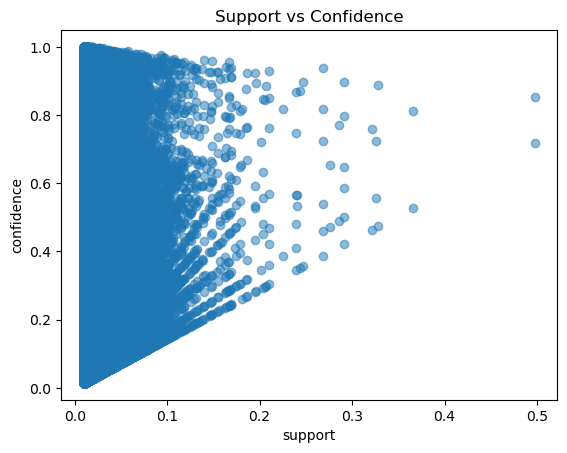

In [14]:
plt.scatter(rules['support'], rules['confidence'], alpha=0.5)
plt.xlabel('support')
plt.ylabel('confidence')
plt.title('Support vs Confidence')
plt.show()

Confidence Levels: High confidence is often observed at lower support levels, indicating that rare item combinations frequently result in purchases when they do occur, particularly for niche items with strong associations.

Support Levels: Increasing support leads to more variable and generally lower confidence. This suggests that as itemsets appear more commonly, the probability of consequent purchases doesn't increase at the same rate, reflecting diverse buyer behaviors.

In [15]:
frequent_itemsets2 = apriori(basket_bool, min_support=0.005, use_colnames=True)
rules2 = association_rules(frequent_itemsets2, metric="confidence", min_threshold=0.1)
rules2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(ALIMENTACAO CORRENTE),(AGUAS),0.692119,0.182052,0.147220,0.212710,1.168400,0.021219,1.038941,0.468130
1,(AGUAS),(ALIMENTACAO CORRENTE),0.182052,0.692119,0.147220,0.808671,1.168400,0.021219,1.609174,0.176207
2,(BENS ESSENCIAIS),(AGUAS),0.583734,0.182052,0.134580,0.230551,1.266399,0.028310,1.063030,0.505348
3,(AGUAS),(BENS ESSENCIAIS),0.182052,0.583734,0.134580,0.739240,1.266399,0.028310,1.596356,0.257179
4,(CERVEJA),(AGUAS),0.075841,0.182052,0.037520,0.494721,2.717468,0.023713,1.618804,0.683876
...,...,...,...,...,...,...,...,...,...,...
3786185,"(CHARCUTARIA, HIGIENE LAR, FRUTAS E VEGETAIS)","(VINHO, REFRIGERANTES, QUEIJOS, BENS ESSENCIAI...",0.049931,0.013841,0.005033,0.100802,7.282724,0.004342,1.096709,0.908028
3786186,"(CHARCUTARIA, QUEIJOS, HIGIENE LAR)","(VINHO, REFRIGERANTES, FRUTAS E VEGETAIS, BENS...",0.046442,0.017273,0.005033,0.108374,6.274231,0.004231,1.102175,0.881560
3786187,"(CHARCUTARIA, LEITE, HIGIENE LAR)","(VINHO, REFRIGERANTES, FRUTAS E VEGETAIS, QUEI...",0.035861,0.013326,0.005033,0.140351,10.531737,0.004555,1.147763,0.938712
3786188,"(PRODUTOS LACTEOS, CHARCUTARIA, HIGIENE LAR)","(VINHO, REFRIGERANTES, FRUTAS E VEGETAIS, QUEI...",0.048101,0.011897,0.005033,0.104637,8.795573,0.004461,1.103579,0.931093


In [16]:
rules2.sort_values(["support", "confidence","lift"],axis = 0, ascending = False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
43,(BENS ESSENCIAIS),(ALIMENTACAO CORRENTE),0.583734,0.692119,0.497598,0.852440,1.231638,0.093585,2.086480,0.451810
44,(ALIMENTACAO CORRENTE),(BENS ESSENCIAIS),0.692119,0.583734,0.497598,0.718949,1.231638,0.093585,1.481105,0.610863
49,(CONGELADOS),(ALIMENTACAO CORRENTE),0.450126,0.692119,0.365820,0.812706,1.174230,0.054280,1.643845,0.269840
50,(ALIMENTACAO CORRENTE),(CONGELADOS),0.692119,0.450126,0.365820,0.528551,1.174230,0.054280,1.166350,0.481933
72,(PRODUTOS LACTEOS),(ALIMENTACAO CORRENTE),0.369995,0.692119,0.328357,0.887463,1.282242,0.072277,2.735832,0.349388
73,(ALIMENTACAO CORRENTE),(PRODUTOS LACTEOS),0.692119,0.369995,0.328357,0.474424,1.282242,0.072277,1.198693,0.714937
93,(CONGELADOS),(BENS ESSENCIAIS),0.450126,0.583734,0.325498,0.723126,1.238794,0.062744,1.503449,0.350559
92,(BENS ESSENCIAIS),(CONGELADOS),0.583734,0.450126,0.325498,0.557613,1.238794,0.062744,1.242971,0.463077
56,(FRUTAS E VEGETAIS),(ALIMENTACAO CORRENTE),0.423130,0.692119,0.321036,0.758719,1.096226,0.028180,1.276026,0.152165
55,(ALIMENTACAO CORRENTE),(FRUTAS E VEGETAIS),0.692119,0.423130,0.321036,0.463846,1.096226,0.028180,1.075941,0.285109


By lowering the minimum support to 0.005, the most significant associations identified in the analysis are between "Bens Essenciais" and "Alimentação Corrente," and "Produtos Lácteos" and "Alimentação Corrente." Both pairs exhibit high confidence and lift values, indicating strong and frequent co-purchases. These insights suggest that essentials and dairy products are commonly bought alongside general food items, pointing to crucial cross-selling opportunities.

### Filter by Confidence and Lift

In [17]:
# Identify the strongest - positive relation
rules_filtered = rules[(rules['lift'] >= 1) & (rules['confidence'] >= 0.8)]
rules_filtered.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
1,(AGUAS),(ALIMENTACAO CORRENTE),0.182052,0.692119,0.147220,0.808671,1.168400,0.021219,1.609174,0.176207
42,(BENS ESSENCIAIS),(ALIMENTACAO CORRENTE),0.583734,0.692119,0.497598,0.852440,1.231638,0.093585,2.086480,0.451810
44,(CERVEJA),(ALIMENTACAO CORRENTE),0.075841,0.692119,0.064688,0.852941,1.232363,0.012197,2.093594,0.204024
46,(CHARCUTARIA),(ALIMENTACAO CORRENTE),0.233013,0.692119,0.206589,0.886598,1.280992,0.045316,2.714955,0.285995
48,(CONGELADOS),(ALIMENTACAO CORRENTE),0.450126,0.692119,0.365820,0.812706,1.174230,0.054280,1.643845,0.269840
51,(DESTILADOS),(ALIMENTACAO CORRENTE),0.147849,0.692119,0.127488,0.862282,1.245859,0.025159,2.235600,0.231580
52,(DETERGENTES),(ALIMENTACAO CORRENTE),0.113304,0.692119,0.101636,0.897022,1.296052,0.023216,2.989771,0.257615
57,(HIGIENE LAR),(ALIMENTACAO CORRENTE),0.211164,0.692119,0.185255,0.877302,1.267561,0.039104,2.509268,0.267588
58,(HIGIENE PESSOAL),(ALIMENTACAO CORRENTE),0.093571,0.692119,0.080702,0.862469,1.246130,0.015940,2.238641,0.217905
60,(LEITE),(ALIMENTACAO CORRENTE),0.275681,0.692119,0.247255,0.896888,1.295859,0.056451,2.985893,0.315208


This analysis highlights association rules with a lift value greater than or equal to 1 and a confidence level of at least 0.8, indicating strong positive relationships between various product categories and the purchase of "Alimentação Corrente" (general food items). Key findings reveal that products like Charcutaria, Leite, and Detergentes are frequently bought alongside general food items, showcasing high purchasing affinity. 

#### Visualizing Top 10 Association Rules: A Scatter Plot Analysis

C:\Users\Bernardo Leite\AppData\Local\Temp\ipykernel_12928\2222578692.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rules_filtered['antecedents'] = rules_filtered['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\Bernardo Leite\AppData\Local\Temp\ipykernel_12928\2222578692.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rules_filtered['consequents'] = rules_filtered['consequents'].apply(lambda x: ', '.join(list(x)))


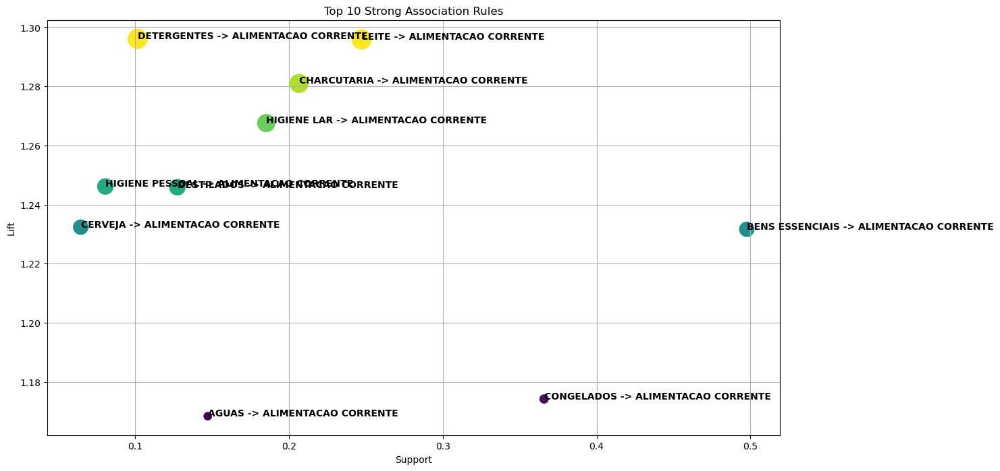

In [18]:
rules_filtered['antecedents'] = rules_filtered['antecedents'].apply(lambda x: ', '.join(list(x)))
rules_filtered['consequents'] = rules_filtered['consequents'].apply(lambda x: ', '.join(list(x)))

# Selecting a manageable number of rules to plot
sampled_rules = rules_filtered.head(10)  # Adjust this line if you need more samples

# Creating the scatter plot
plt.figure(figsize=(14, 8))
scatter = sns.scatterplot(data=sampled_rules, x='support', y='lift', size='confidence', sizes=(100, 500), hue='confidence', palette='viridis', legend=False)

# Adding annotations for each point
for line in range(0, sampled_rules.shape[0]):
    scatter.text(sampled_rules.support.iloc[line], sampled_rules.lift.iloc[line], 
                 f"{sampled_rules.antecedents.iloc[line]} -> {sampled_rules.consequents.iloc[line]}", 
                 horizontalalignment='left', size='medium', color='black', weight='semibold')

plt.title('Top 10 Strong Association Rules')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

Higher Lift Values: Points like 'DETERGENTES -> ALIMENTACAO CORRENTE' at the top have the highest lift, suggesting a very strong association relative to the norms of this dataset. This means when detergents are bought, items from 'ALIMENTACAO CORRENTE' (everyday food items) are also likely to be bought.

Support Variation: Products like 'CONGELADOS -> ALIMENTACAO CORRENTE' have higher support but lower lift compared to 'DETERGENTES -> ALIMENTACAO CORRENTE'. This implies that frozen foods and everyday food items are commonly bought together, but this association is not as uniquely dependent as detergents and food items.

Categories: The plot indicates various product categories like hygiene products, dairy, charcuterie, and essential goods, and their association with everyday food purchases.

### Top rules using support higher than 0.6 and lift higher than 1

In [19]:
# Identify the most frequent items and check their presence in rules with the highest lift.
top_items = frequent_itemsets[frequent_itemsets['support'] > 0.6]['itemsets']
top_rules = rules[rules['antecedents'].isin(top_items) & (rules['lift'] > 1)]
top_rules = top_rules.sort_values(by='lift', ascending=False)
top_rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
709561,(ALIMENTACAO CORRENTE),"(REFRIGERANTES, FRUTAS E VEGETAIS, CONGELADOS,...",0.692119,0.011267,0.011267,0.016280,1.444839,0.003469,1.005095,1.0
577387,(ALIMENTACAO CORRENTE),"(PROD. CONFEITARIA, CHARCUTARIA, BENS ESSENCIA...",0.692119,0.012869,0.012869,0.018594,1.444839,0.003962,1.005833,1.0
424690,(ALIMENTACAO CORRENTE),"(REFRIGERANTES, FRUTAS E VEGETAIS, CONGELADOS,...",0.692119,0.012755,0.012755,0.018428,1.444839,0.003927,1.005780,1.0
344711,(ALIMENTACAO CORRENTE),"(TALHO, REFRIGERANTES, PROD. CONFEITARIA, BENS...",0.692119,0.011382,0.011382,0.016445,1.444839,0.003504,1.005148,1.0
131731,(ALIMENTACAO CORRENTE),"(VINHO, TALHO, OVOS, CHARCUTARIA)",0.692119,0.011382,0.011382,0.016445,1.444839,0.003504,1.005148,1.0
775573,(ALIMENTACAO CORRENTE),"(VINHO, CHARCUTARIA, BENS ESSENCIAIS, QUEIJOS,...",0.692119,0.012125,0.012125,0.017519,1.444839,0.003733,1.005490,1.0
680456,(ALIMENTACAO CORRENTE),"(VINHO, PROD. CONFEITARIA, FRUTAS E VEGETAIS, ...",0.692119,0.012240,0.012240,0.017684,1.444839,0.003768,1.005543,1.0
429403,(ALIMENTACAO CORRENTE),"(VINHO, CONGELADOS, TAKE-AWAY, PRODUTOS LACTEO...",0.692119,0.010410,0.010410,0.015040,1.444839,0.003205,1.004701,1.0
142649,(ALIMENTACAO CORRENTE),"(CONGELADOS, TAKE-AWAY, OVOS, PROD. CONFEITARIA)",0.692119,0.010810,0.010810,0.015619,1.444839,0.003328,1.004885,1.0
615692,(ALIMENTACAO CORRENTE),"(VINHO, REFRIGERANTES, PROD. CONFEITARIA, CHAR...",0.692119,0.010238,0.010238,0.014792,1.444839,0.003152,1.004623,1.0


The results of the association rule analysis highlight strong relationships where 'ALIMENTACAO CORRENTE' (everyday food items) are purchased along with a variety of other product categories, particularly under the condition of a support threshold higher than 0,6. Despite this relatively low support threshold, the strong lift values across all these rules indicate significantly strong dependencies between these product purchases.

### Confidence Analysis for categories higher than 0.4 confidence

In [20]:
# Calculate confidence for the top rules
top_rules['confidence'] = top_rules['confidence'].astype(float)
high_confidence_rules = top_rules[top_rules['confidence'] > 0.4]  # adjust threshold as necessary
high_confidence_rules = high_confidence_rules.sort_values(by='confidence', ascending=False)
high_confidence_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
43,(ALIMENTACAO CORRENTE),(BENS ESSENCIAIS),0.692119,0.583734,0.497598,0.718949,1.231638,0.093585,1.481105,0.610863
49,(ALIMENTACAO CORRENTE),(CONGELADOS),0.692119,0.450126,0.365820,0.528551,1.174230,0.054280,1.166350,0.481933
73,(ALIMENTACAO CORRENTE),(PRODUTOS LACTEOS),0.692119,0.369995,0.328357,0.474424,1.282242,0.072277,1.198693,0.714937
54,(ALIMENTACAO CORRENTE),(FRUTAS E VEGETAIS),0.692119,0.423130,0.321036,0.463846,1.096226,0.028180,1.075941,0.285109
1626,(ALIMENTACAO CORRENTE),"(BENS ESSENCIAIS, CONGELADOS)",0.692119,0.325498,0.291752,0.421535,1.295049,0.066470,1.166022,0.739988


The association rule analysis above focuses on relationships involving 'ALIMENTACAO CORRENTE' (everyday food items) with a confidence level above 0,4. This highlights strong buying patterns and significant associations between everyday food items and other specific product categories such as 'BENS ESSENCIAIS' (essential goods), 'CONGELADOS' (frozen goods), and 'PRODUTOS LACTEOS' (dairy products).

### Viewing Scatter Plot of Association Rules

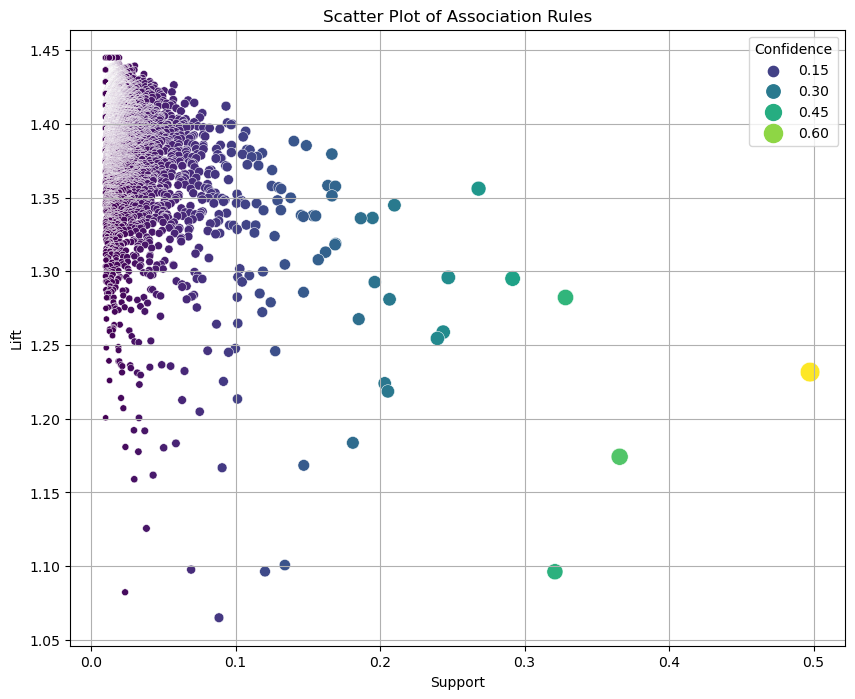

In [21]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=top_rules, x='support', y='lift', size='confidence', hue='confidence', palette='viridis', sizes=(20, 200))
plt.title('Scatter Plot of Association Rules')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.legend(title='Confidence')
plt.grid(True)
plt.show()

 Relation between support, lift and confidence

Points on the graph represent individual rules, color-coded by confidence levels. Most rules are clustered at lower support levels, indicating that while many item combinations are less frequent, some have high lift values, signifying strong associations. Higher confidence and lift values are observed at very specific, less frequent itemsets, highlighting potentially valuable but less obvious market basket combinations. 

### Defining Promotions Strategy Column

In [22]:
# Create a promotions DataFrame based on rules with higher lift and confidence.
promotions = rules[(rules['lift'] > 1.5) & (rules['confidence'] > 0.8)]
promotions['promotion'] = promotions['consequents'].apply(lambda x: "Promotion: " + ', '.join(x))
promotions

C:\Users\Bernardo Leite\AppData\Local\Temp\ipykernel_12928\3579819252.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  promotions['promotion'] = promotions['consequents'].apply(lambda x: "Promotion: " + ', '.join(x))


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,promotion
633,"(DETERGENTES, AGUAS)",(BENS ESSENCIAIS),0.039293,0.583734,0.034660,0.882096,1.511128,0.011724,3.530555,0.352077,Promotion: BENS ESSENCIAIS
994,"(TALHO, AGUAS)",(CONGELADOS),0.049588,0.450126,0.042153,0.850058,1.888489,0.019832,3.667238,0.495023,Promotion: CONGELADOS
1612,"(CERVEJA, ALIMENTACAO CORRENTE)",(BENS ESSENCIAIS),0.064688,0.583734,0.057424,0.887710,1.520745,0.019664,3.707064,0.366110,Promotion: BENS ESSENCIAIS
1635,"(DETERGENTES, ALIMENTACAO CORRENTE)",(BENS ESSENCIAIS),0.101636,0.583734,0.091684,0.902082,1.545366,0.032356,4.251179,0.392830,Promotion: BENS ESSENCIAIS
1637,(DETERGENTES),"(BENS ESSENCIAIS, ALIMENTACAO CORRENTE)",0.113304,0.497598,0.091684,0.809187,1.626187,0.035304,2.632960,0.434269,"Promotion: BENS ESSENCIAIS, ALIMENTACAO CORRENTE"
...,...,...,...,...,...,...,...,...,...,...,...
839112,"(VINHO, ALIMENTACAO CORRENTE, FRUTAS E VEGETAI...","(BENS ESSENCIAIS, CONGELADOS)",0.012297,0.325498,0.010066,0.818605,2.514933,0.006064,3.718411,0.609875,"Promotion: BENS ESSENCIAIS, CONGELADOS"
839125,"(VINHO, FRUTAS E VEGETAIS, QUEIJOS, BENS ESSEN...","(PRODUTOS LACTEOS, ALIMENTACAO CORRENTE)",0.012183,0.328357,0.010066,0.826291,2.516438,0.006066,3.866483,0.610045,"Promotion: PRODUTOS LACTEOS, ALIMENTACAO CORRENTE"
839127,"(VINHO, FRUTAS E VEGETAIS, QUEIJOS, BENS ESSEN...","(CONGELADOS, ALIMENTACAO CORRENTE)",0.011611,0.365820,0.010066,0.866995,2.370003,0.005819,4.768093,0.584850,"Promotion: CONGELADOS, ALIMENTACAO CORRENTE"
839128,"(VINHO, FRUTAS E VEGETAIS, QUEIJOS, LEITE, CON...","(BENS ESSENCIAIS, ALIMENTACAO CORRENTE)",0.010638,0.497598,0.010066,0.946237,1.901609,0.004773,9.344681,0.479228,"Promotion: BENS ESSENCIAIS, ALIMENTACAO CORRENTE"


## Market Basket Analysis (MBA) - Product Description 

#### Data Preparation for MBA per Product Description

In [23]:
df_Products_market_basket = client_transactions.copy()

In [24]:
# Reducing dataset for a CATEGORY focus in first analyze
df_Products_market_basket.drop(['ID Client Type', 'Day of Week', 'Location', 'ID Product Category'], axis=1, inplace = True)

In [25]:
df_Products_market_basket['single_transaction'] = df_Products_market_basket['Client ID'].astype(str) + '_' + df_Products_market_basket['Date'].astype(str)
df_Products_market_basket.head()

,ID Product,Product Description,Date,Client ID,Client Type Description,Season,Week Value,single_transaction
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,2019-03-01,4917,RODÍZIO CARNE,1.0,2.0,4917_2019-03-01
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,2019-03-06,4917,RODÍZIO CARNE,1.0,1.0,4917_2019-03-06
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,2019-03-08,4917,RODÍZIO CARNE,1.0,2.0,4917_2019-03-08
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,2019-03-15,4917,RODÍZIO CARNE,1.0,2.0,4917_2019-03-15
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,2019-03-20,4917,RODÍZIO CARNE,1.0,1.0,4917_2019-03-20


In [26]:
df_Products_market_basket_cross = pd.crosstab(df_Products_market_basket['single_transaction'], df_Products_market_basket['Product Description'])
df_Products_market_basket_cross.head()

Product Description,* CALDO VERDE,* CREME DE CENOURA,* CREME DE LEGUMES,* CREME VEGETAIS C/ESPINAFRES (S/BATATA),* SOPA DE FEIJAO BRANCO C/COUVE CORACAO,* SOPA DE FEIJÃO VERDE,* SOPA DE GRÃO C/ESPINAFRES,* SOPA DE LEGUMES,* SOPA DE LEGUMES SEM BATATA,* SOPA FJ. ENCARNADO C/ LEGUMES,...,ÁGUA MINERAL CALDAS DE PENACOVA PET 50CL,ÁGUA SERRA DA ESTRELA 50CL,ÁGUA TÓNICA SCHWEPPES ORIGINAL 1LT,ÁGUA TÓNICA SCHWEPPES ORIGINAL TP 25CL,ÁGUA VITALIS 50CL,ÁLCOOL ETÍLICO SANITÁRIO 96% 250ML AMANH,ÓLEO DE PALMA GUINEA'S 780ML,ÓLEO FULA ALIMENTAR 3 LT,ÓLEO VAQUEIRO ALIMENTAR 1 LT,ÓLEO VAQUEIRO ALIMENTAR 3 LT
single_transaction,,,,,,,,,,,,,,,,,,,,,
1013_2019-03-01,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1013_2019-03-05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1013_2019-03-08,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1013_2019-03-12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1013_2019-03-15,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [27]:
# Function to encode values into booleans
def encode_units(x):
    return True if x > 0 else False
    
# Applying the function to the DataFrame to convert counts into boolean values
basket_bool_products = df_Products_market_basket_cross.applymap(encode_units)
basket_bool_products

Product Description,* CALDO VERDE,* CREME DE CENOURA,* CREME DE LEGUMES,* CREME VEGETAIS C/ESPINAFRES (S/BATATA),* SOPA DE FEIJAO BRANCO C/COUVE CORACAO,* SOPA DE FEIJÃO VERDE,* SOPA DE GRÃO C/ESPINAFRES,* SOPA DE LEGUMES,* SOPA DE LEGUMES SEM BATATA,* SOPA FJ. ENCARNADO C/ LEGUMES,...,ÁGUA MINERAL CALDAS DE PENACOVA PET 50CL,ÁGUA SERRA DA ESTRELA 50CL,ÁGUA TÓNICA SCHWEPPES ORIGINAL 1LT,ÁGUA TÓNICA SCHWEPPES ORIGINAL TP 25CL,ÁGUA VITALIS 50CL,ÁLCOOL ETÍLICO SANITÁRIO 96% 250ML AMANH,ÓLEO DE PALMA GUINEA'S 780ML,ÓLEO FULA ALIMENTAR 3 LT,ÓLEO VAQUEIRO ALIMENTAR 1 LT,ÓLEO VAQUEIRO ALIMENTAR 3 LT
single_transaction,,,,,,,,,,,,,,,,,,,,,
1013_2019-03-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1013_2019-03-05,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1013_2019-03-08,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1013_2019-03-12,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1013_2019-03-15,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
892_2019-05-22,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
892_2019-05-29,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
928_2019-03-07,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


### Association Rules - Apriori Algorithm for MBA

In [28]:
frequent_itemsets_products = apriori(basket_bool_products, min_support=0.01, use_colnames=True)

rules_products = association_rules(frequent_itemsets_products, metric="lift")

rules_products.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(ABACATE HASS MATURADO RCH),(PEPINO RCH),0.019160,0.059083,0.012125,0.632836,10.711037,0.010993,2.562661,0.924349
1,(PEPINO RCH),(ABACATE HASS MATURADO RCH),0.059083,0.019160,0.012125,0.205227,10.711037,0.010993,1.234114,0.963568
2,(ABACATE RCH),(MANGA BARCO CAL 7/9 RCH),0.018932,0.041066,0.010066,0.531722,12.947950,0.009289,2.047788,0.940574
3,(MANGA BARCO CAL 7/9 RCH),(ABACATE RCH),0.041066,0.018932,0.010066,0.245125,12.947950,0.009289,1.299644,0.962285
4,(ABACATE RCH),(PEPINO RCH),0.018932,0.059083,0.012926,0.682779,11.556356,0.011808,2.966130,0.931095


In [29]:
rules_products.sort_values(["support", "confidence","lift"],axis = 0, ascending = False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
115,(OLEO ALIMENTAR MCHEF 10 LT),(ACUCAR MCHEF BRANCO PAPEL KG),0.159918,0.192462,0.058396,0.365165,1.897336,0.027618,1.272043,0.562975
114,(ACUCAR MCHEF BRANCO PAPEL KG),(OLEO ALIMENTAR MCHEF 10 LT),0.192462,0.159918,0.058396,0.303418,1.897336,0.027618,1.206006,0.585663
97,(LEITE MCHEF UHT M/GORDO LT),(ACUCAR MCHEF BRANCO PAPEL KG),0.139327,0.192462,0.051647,0.370690,1.926044,0.024832,1.283212,0.558634
96,(ACUCAR MCHEF BRANCO PAPEL KG),(LEITE MCHEF UHT M/GORDO LT),0.192462,0.139327,0.051647,0.268351,1.926044,0.024832,1.176346,0.595391
774,(REF COCA COLA ZERO LATA 33CL),(REF COCA COLA ORIGINAL LATA 33CL),0.057939,0.066976,0.044326,0.765054,11.422894,0.040446,3.971234,0.968574
775,(REF COCA COLA ORIGINAL LATA 33CL),(REF COCA COLA ZERO LATA 33CL),0.066976,0.057939,0.044326,0.661827,11.422894,0.040446,2.785742,0.977956
635,(LEITE MCHEF UHT M/GORDO LT),(OLEO ALIMENTAR MCHEF 10 LT),0.139327,0.159918,0.044097,0.316502,1.979159,0.021817,1.229093,0.574824
634,(OLEO ALIMENTAR MCHEF 10 LT),(LEITE MCHEF UHT M/GORDO LT),0.159918,0.139327,0.044097,0.275751,1.979159,0.021817,1.188366,0.588912
77,(FARINHA MCHEF S/FERMENTO 1KG),(ACUCAR MCHEF BRANCO PAPEL KG),0.080931,0.192462,0.042324,0.522968,2.717259,0.026748,1.692840,0.687633
76,(ACUCAR MCHEF BRANCO PAPEL KG),(FARINHA MCHEF S/FERMENTO 1KG),0.192462,0.080931,0.042324,0.219911,2.717259,0.026748,1.178159,0.782603


Symmetric Relationships: Products like MCHEF olive oil and MCHEF white sugar demonstrate strong mutual associations, suggesting effective cross-selling opportunities.

Highlighted Pair: Coca Cola Zero and Original show an exceptionally high lift, indicating customers frequently buy these together, highlighting a potent cross-promotion opportunity.

Baking Products: Associations between common baking ingredients like MCHEF sugar, flour, and milk suggest these could be marketed together in promotions to drive sales.

Strategic Insights: High leverage and conviction values across these rules suggest that strategic product placement could significantly enhance cross-purchasing behaviors.

### Products Support vs Confidence Scatter Plot

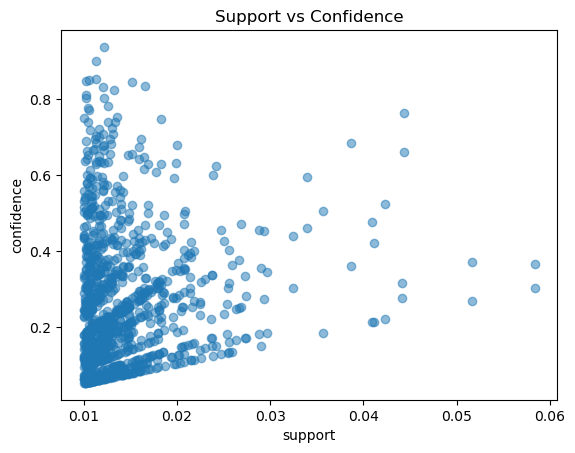

In [30]:
plt.scatter(rules_products['support'], rules_products['confidence'], alpha=0.5)
plt.xlabel('support')
plt.ylabel('confidence')
plt.title('Support vs Confidence')
plt.show()

There's a notable trend where some item combinations, though infrequent (support between 0.01 and 0.06), are bought together a significant proportion of the time, indicated by higher confidence levels up to 0.8.

These high confidence, low support rules suggest targeted opportunities for promotions or bundling strategies, potentially increasing sales by leveraging these strong but specific associations.

### Filter by Confidence and Lift

In [31]:
# Identify the strongest rules suggesting a positive relationship between the items
rules_filtered_products = rules_products[(rules_products['lift'] >= 1) & (rules_products['confidence'] >= 0.8)]
rules_filtered_products.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
249,(ALHO FRANCÊS CORTADO 750G 4G MCHEF RCH),(PEPINO RCH),0.012068,0.059083,0.010238,0.848341,14.358565,0.009525,6.204174,0.941720
576,"(GEL.CAT.GOURMES CHOC.4,5LT)","(GEL.CAT.GOURMES BAUNILHA 4,5LT)",0.016072,0.035289,0.013269,0.825623,23.395768,0.012702,5.532320,0.972893
579,"(GEL.CAT.GOURMES MORANGO 4,5LT)","(GEL.CAT.GOURMES BAUNILHA 4,5LT)",0.019790,0.035289,0.016529,0.835260,23.668862,0.015831,5.855963,0.977086
597,(ICE TEA LIPTON MANGA LATA 33CL),(ICE TEA LIPTON PÊSSEGO LATA 33CL),0.017902,0.028998,0.015157,0.846645,29.196741,0.014638,6.331743,0.983354
609,(MAÇÃ GOLDEN CAL65/70 50*30 2CAM RCH),(LARANJA CAL7 (67/76) RCH),0.012526,0.064688,0.010181,0.812785,12.564757,0.009370,4.995936,0.932087
916,"(REF COCA COLA ZERO LATA 33CL, ACUCAR MCHEF BR...",(REF COCA COLA ORIGINAL LATA 33CL),0.014413,0.066976,0.012011,0.833333,12.442357,0.011046,5.598147,0.933078
971,"(TOMATE BB 67/82 1CAM RCH, OLEO ALIMENTAR MCHE...",(ALFACE FRISADA PLT),0.012755,0.106898,0.010238,0.802691,7.508958,0.008875,4.526405,0.878025
1018,"(GEL.CAT.GOURMES CHOC.4,5LT, GEL.CAT.GOURMES B...","(GEL.CAT.GOURMES MORANGO 4,5LT)",0.013269,0.019790,0.011325,0.853448,43.126271,0.011062,6.688495,0.989948
1019,"(GEL.CAT.GOURMES CHOC.4,5LT, GEL.CAT.GOURMES M...","(GEL.CAT.GOURMES BAUNILHA 4,5LT)",0.012583,0.035289,0.011325,0.900000,25.503404,0.010881,9.647106,0.973033
1025,"(ICE TEA LIPTON LIMÃO LATA 33CL, ICE TEA LIPTO...",(ICE TEA LIPTON PÊSSEGO LATA 33CL),0.012983,0.028998,0.012183,0.938326,32.358366,0.011806,15.744105,0.981844


The analysis reveals strong product associations with high lift and confidence values, indicating that products like different flavors of ice cream and iced tea are frequently bought together.

The pairings of different flavors of ice cream and iced tea show exceptionally high lift values, such as the combination of mango and peach flavored Lipton iced tea (lift = 32.358), and various Gourmet ice cream flavors (lifts ranging from 23.395 to 43.126). These high lift values suggest that these product combinations are purchased together much more frequently than would be expected if they were independent of each other

The confidence levels are particularly notable in the case of Gourmet strawberry and vanilla ice cream, where purchasing one flavor strongly predicts the purchase of the other.

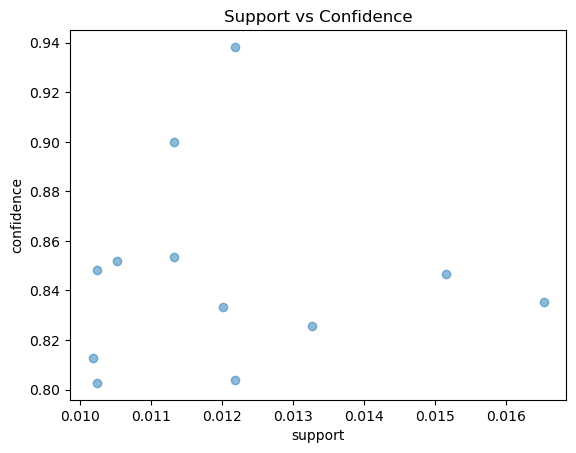

In [32]:
plt.scatter(rules_filtered_products['support'], rules_filtered_products['confidence'], alpha=0.5)
plt.xlabel('support')
plt.ylabel('confidence')
plt.title('Support vs Confidence')
plt.show()

Confidence levels are consistently high, mostly above 0.80. This suggests a strong likelihood that when one product is bought, the other is also likely to be purchased.

Support varies more significantly, ranging from just over 0.010 to nearly 0.016. This shows the relative frequency of the product pairs being bought together, with some combinations occurring more frequently than others.

C:\Users\Bernardo Leite\AppData\Local\Temp\ipykernel_12928\3020162434.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rules_filtered_products['antecedents'] = rules_filtered_products['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\Bernardo Leite\AppData\Local\Temp\ipykernel_12928\3020162434.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rules_filtered_products['consequents'] = rules_filtered_products['consequents'].apply(lambda x: ', '.join(list(x)))


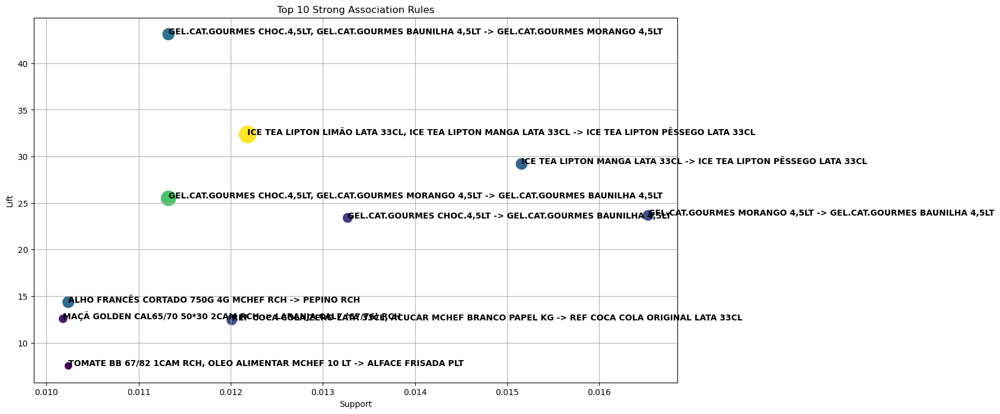

In [33]:
rules_filtered_products['antecedents'] = rules_filtered_products['antecedents'].apply(lambda x: ', '.join(list(x)))
rules_filtered_products['consequents'] = rules_filtered_products['consequents'].apply(lambda x: ', '.join(list(x)))

# Selecting a manageable number of rules to plot
sampled_rules_products = rules_filtered_products.head(10)  # Adjust this line if you need more samples

# Creating the scatter plot
plt.figure(figsize=(14, 8))
scatter = sns.scatterplot(data=sampled_rules_products, x='support', y='lift', size='confidence', sizes=(100, 500), hue='confidence', palette='viridis', legend=False)

# Adding annotations for each point
for line in range(0, sampled_rules_products.shape[0]):
    scatter.text(sampled_rules_products.support.iloc[line], sampled_rules_products.lift.iloc[line], 
                 f"{sampled_rules_products.antecedents.iloc[line]} -> {sampled_rules_products.consequents.iloc[line]}", 
                 horizontalalignment='left', size='medium', color='black', weight='semibold')

plt.title('Top 10 Strong Association Rules')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

Ice Creams: The association between different flavors of Gourmet ice cream (strawberry, chocolate, and vanilla) shows the highest lift values, indicating these are frequently bought together.

Iced Teas: The combinations of different flavors of Lipton iced tea (mango with lemon and mango with peach) also show very high lift values, suggesting strong co-purchase patterns.

### Top rules using support and lift

In [34]:
# Identify the most frequent items and check their presence in rules with the highest lift.
top_items_products = frequent_itemsets_products[frequent_itemsets_products['support'] > 0.19]['itemsets']
top_rules_products = rules_products[rules_products['antecedents'].isin(top_items_products) & (rules_products['lift'] > 1)]
top_rules_products = top_rules_products.sort_values(by='lift', ascending=False)
top_rules_products

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
914,(ACUCAR MCHEF BRANCO PAPEL KG),"(VINAGRE BR M CHEF 1LT, POLPA TOMATE MASTERCHE...",0.192462,0.019561,0.012812,0.066568,3.403123,0.009047,1.050359,0.874450
830,(ACUCAR MCHEF BRANCO PAPEL KG),"(VINAGRE BR M CHEF 1LT, DET LOICA MCHEF 10LT)",0.192462,0.022478,0.014699,0.076374,3.397788,0.010373,1.058353,0.873879
805,(ACUCAR MCHEF BRANCO PAPEL KG),"(FARINHA MCHEF S/FERMENTO 1KG, DET LOICA MCHEF...",0.192462,0.017959,0.011668,0.060624,3.375641,0.008211,1.045418,0.871488
848,(ACUCAR MCHEF BRANCO PAPEL KG),"(VINAGRE BR M CHEF 1LT, FARINHA MCHEF S/FERMEN...",0.192462,0.018245,0.011611,0.060327,3.306443,0.008099,1.044783,0.863811
74,(ACUCAR MCHEF BRANCO PAPEL KG),(FARINHA BRANCA DE NEVE FINA 1KG),0.192462,0.029112,0.017730,0.092125,3.164460,0.012127,1.069407,0.847007
...,...,...,...,...,...,...,...,...,...,...
21,(ACUCAR MCHEF BRANCO PAPEL KG),(AGUA C/GAS PEDRAS SALGADAS 25CL),0.192462,0.041752,0.011039,0.057355,1.373695,0.003003,1.016552,0.336871
52,(ACUCAR MCHEF BRANCO PAPEL KG),(CENOURA SC10KG (CAL25/40) RCH),0.192462,0.058854,0.015385,0.079941,1.358290,0.004058,1.022919,0.326648
142,(ACUCAR MCHEF BRANCO PAPEL KG),(PRESUNTO FATIAS MASTERCHEF KG),0.192462,0.039922,0.010410,0.054086,1.354789,0.002726,1.014974,0.324291
147,(ACUCAR MCHEF BRANCO PAPEL KG),(REF COCA COLA ORIGINAL LATA 33CL),0.192462,0.066976,0.016930,0.087964,1.313380,0.004040,1.023013,0.295473


The antecedent in all the rules is the same: ACUCAR MCHEF BRANCO PAPEL KG. This indicates that sugar is a very frequent item, and its associations with various other products are being explored.

The top associations (like those with the highest lifts, involving combinations of products like POLPA TOMATE MASTERCHEFF 1KG, VINAGRE BR M CHEF...) suggest complementary goods that might be used together in cooking or baking.

The products associated at the lower end of the lift scale, such as AGUA C/GAS PEDRAS SALGADAS 25CL or REF COCA COLA ORIGINAL LATA 33CL, may not be as strongly related to sugar but still show a statistically significant relationship.

### Confidence Analysis 

In [35]:
# Calculate confidence for the top rules
top_rules_products['confidence'] = top_rules_products['confidence'].astype(float)
high_confidence_rules_products = top_rules_products[top_rules_products['confidence'] > 0.2]  
high_confidence_rules_products = high_confidence_rules_products.sort_values(by='confidence', ascending=False)
high_confidence_rules_products


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
114,(ACUCAR MCHEF BRANCO PAPEL KG),(OLEO ALIMENTAR MCHEF 10 LT),0.192462,0.159918,0.058396,0.303418,1.897336,0.027618,1.206006,0.585663
96,(ACUCAR MCHEF BRANCO PAPEL KG),(LEITE MCHEF UHT M/GORDO LT),0.192462,0.139327,0.051647,0.268351,1.926044,0.024832,1.176346,0.595391
76,(ACUCAR MCHEF BRANCO PAPEL KG),(FARINHA MCHEF S/FERMENTO 1KG),0.192462,0.080931,0.042324,0.219911,2.717259,0.026748,1.178159,0.782603
66,(ACUCAR MCHEF BRANCO PAPEL KG),(DET LOICA MCHEF 10LT),0.192462,0.097575,0.041181,0.213967,2.192851,0.022401,1.148076,0.673618
163,(ACUCAR MCHEF BRANCO PAPEL KG),(VINAGRE BR M CHEF 1LT),0.192462,0.086022,0.040952,0.212779,2.473551,0.024396,1.161018,0.737702


Strong Association with Cooking Oil: Sugar has a strong association with Mchef cooking oil (30.34% confidence), suggesting that sugar purchases often include this type of oil.

Association with Milk: Sugar and Mchef UHT milk have a confidence of 26.84%, indicating a moderate association, likely due to their common use in recipes and daily consumption.

High Association with Flour: Mchef flour without yeast shows a confidence of 21.99% when purchased with sugar, highlighting common use in baking preparations. The high lift (2.717) suggests a significantly stronger relationship than would be expected by chance.

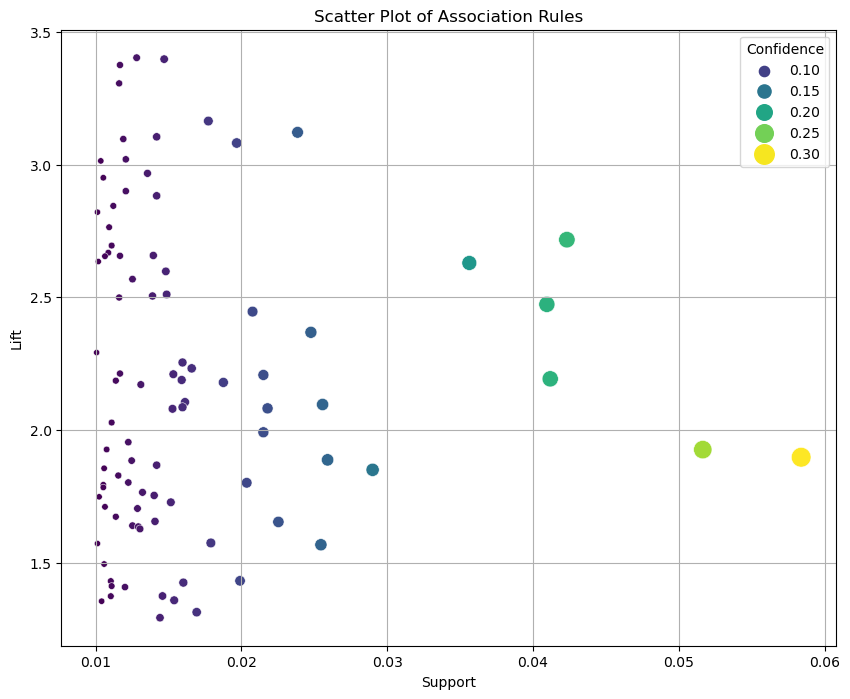

In [36]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=top_rules_products, x='support', y='lift', size='confidence', hue='confidence', palette='viridis', sizes=(20, 200))
plt.title('Scatter Plot of Association Rules')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.legend(title='Confidence')
plt.grid(True)
plt.show()

The scatter plot demonstrates that most association rules have moderate to high lift values (2.0 to 3.0) and varying confidence levels (0.10 to 0.30), suggesting significant but infrequent product associations. Rules with the highest lift and confidence, particularly those with support above 0.03, indicate strong and actionable product relationships, ideal for targeted marketing strategies.

### Promotions Strategy - Column Products

In [37]:
promotions_products = rules_products[(rules_products['lift'] > 1.5) & (rules['confidence'] > 0.8)]
promotions_products['promotion_products'] = promotions_products['consequents'].apply(lambda x: "Promotion_products: " + ', '.join(x))
promotions_products

C:\Users\Bernardo Leite\AppData\Local\Temp\ipykernel_12928\3279675612.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  promotions_products = rules_products[(rules_products['lift'] > 1.5) & (rules['confidence'] > 0.8)]
C:\Users\Bernardo Leite\AppData\Local\Temp\ipykernel_12928\3279675612.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  promotions_products['promotion_products'] = promotions_products['consequents'].apply(lambda x: "Promotion_products: " + ', '.join(x))


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,promotion_products
1,(PEPINO RCH),(ABACATE HASS MATURADO RCH),0.059083,0.019160,0.012125,0.205227,10.711037,0.010993,1.234114,0.963568,Promotion_products: ABACATE HASS MATURADO RCH
42,(ACUCAR MCHEF BRANCO PAPEL KG),(BATATA FRITA PALHA MCHEF 1KG),0.192462,0.039808,0.016129,0.083804,2.105211,0.008468,1.048020,0.650109,Promotion_products: BATATA FRITA PALHA MCHEF 1KG
44,(ACUCAR MCHEF BRANCO PAPEL KG),(BETERRABA RCH),0.192462,0.019961,0.011897,0.061813,3.096661,0.008055,1.044609,0.838439,Promotion_products: BETERRABA RCH
46,(BOLACHA AMANHECER MARIA 4X200GR),(ACUCAR MCHEF BRANCO PAPEL KG),0.020476,0.192462,0.011210,0.547486,2.844650,0.007269,1.784560,0.662018,Promotion_products: ACUCAR MCHEF BRANCO PAPEL KG
48,(ACUCAR MCHEF BRANCO PAPEL KG),"(BROCULOS MCHEF CONG 2,5KG)",0.192462,0.056108,0.021505,0.111738,1.991474,0.010707,1.062628,0.616515,"Promotion_products: BROCULOS MCHEF CONG 2,5KG"
51,(CEBOLA CAL85+ SC15KG RCH),(ACUCAR MCHEF BRANCO PAPEL KG),0.070808,0.192462,0.022535,0.318255,1.653603,0.008907,1.184517,0.425380,Promotion_products: ACUCAR MCHEF BRANCO PAPEL KG
57,(ACUCAR MCHEF BRANCO PAPEL KG),(CERVEJA COM ALCOOL SAGRES TP 33 CL (Cx)),0.192462,0.035347,0.011382,0.059138,1.673094,0.004579,1.025287,0.498187,Promotion_products: CERVEJA COM ALCOOL SAGRES ...
58,(ACUCAR MCHEF BRANCO PAPEL KG),(COUVE CORACAO DE BOI C/FOLHAS RCH),0.192462,0.054335,0.024765,0.128678,2.368209,0.014308,1.085321,0.715433,Promotion_products: COUVE CORACAO DE BOI C/FOL...
60,(ACUCAR MCHEF BRANCO PAPEL KG),(CREME VEGETAL MCHEF CULINAR.KG),0.192462,0.036776,0.015957,0.082912,2.254493,0.008879,1.050307,0.689059,Promotion_products: CREME VEGETAL MCHEF CULINA...
62,(ACUCAR MCHEF BRANCO PAPEL KG),(CURGETE RCH),0.192462,0.033459,0.010124,0.052600,1.572075,0.003684,1.020204,0.450626,Promotion_products: CURGETE RCH


## Clustering with K-Means (not a Recommendation System, but a support to it)

We conducted a clustering segmentation to enrich the analysis and recommendations. Doing so, in the following models, we will develop recommendations for the client ID's not only by product, product category, but also for each cluster.

In [38]:
df_clustering = client_transactions.copy()
df_clustering

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0


In [39]:
df_clustering['Count'] = df_clustering.groupby('ID Client Type')['ID Product'].transform('count')
df_clustering

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value,Count
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0,18641
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0,18641
...,...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0,69737
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0,69737
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0,69737
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0,69737


### Feature selection and scaling

Considering only numeric features - K-Means.

In [40]:
# Select the features you want to use for clustering
features = ['ID Product', 'Client ID', 'ID Client Type', 'Day of Week', 'Season', 'Week Value', 'Count']
X = df_clustering[features]

# Scaling the features to have zero mean and unit variance
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [41]:
# Better initialization method and provide more n_init
kmclust = KMeans(n_clusters=8, init='k-means++', n_init=15, random_state=1)
kmclust.fit(X_scaled)

#init='k-means++' initializes the centroids to be (generally) distant from each other, leading to probably better results than random initialization. n_init=K allows to initialize KMeans K times and pick the best clustering in terms of Inertia

KMeans(n_init=15, random_state=1)

### Defining the number of clusters

In [42]:
range_clusters = range(1, 11)

inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, 
                     init='k-means++', 
                     n_init=15, 
                     random_state=1)
    kmclust.fit(X_scaled)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

### Elbow Method

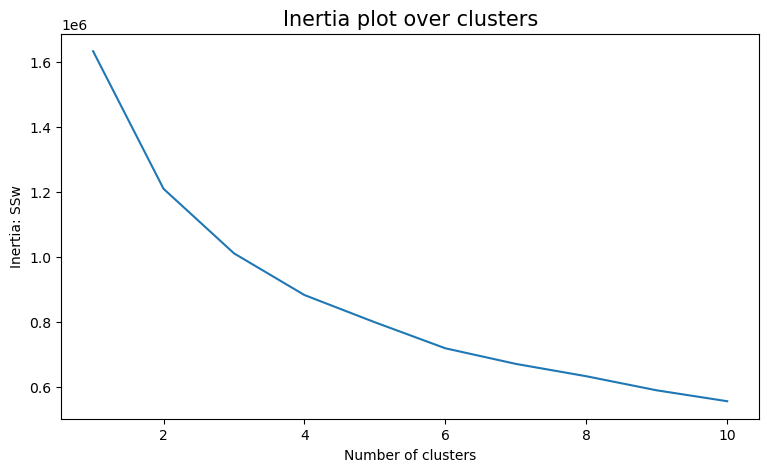

In [43]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

#the lower the inertia the better, the smallest SSw of the centroids - but is too much clusters 
#identify the elbow - 6

There seem to exist 6 clusters.

### Silhouette Score 

In [44]:
# # Storing average silhouette metric
# avg_silhouette = []
# for nclus in range_clusters:
#     # Skip nclus == 1 - WE NEED AT LEAST 2 CLUSTERS
#     if nclus == 1:  
#         continue
    
#     # Create a figure
#     fig = plt.figure(figsize=(13, 7))

#     # Initialize the KMeans object with n_clusters value and a random generator
#     # seed of 10 for reproducibility.
#     kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
#     cluster_labels = kmclust.fit_predict(X_scaled)

#     # The silhouette_score gives the average value for all the samples.
#     # This gives a perspective into the density and separation of the formed clusters
#     silhouette_avg = silhouette_score(X_scaled, cluster_labels)
#     avg_silhouette.append(silhouette_avg)
#     print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

#     # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

#     y_lower = 10
#     for i in range(nclus):
#         # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#         ith_cluster_silhouette_values.sort()
        
#         # Get y_upper to demarcate silhouette y range size
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
        
#         # Filling the silhouette
#         color = cm.nipy_spectral(float(i) / nclus)
#         plt.fill_betweenx(np.arange(y_lower, y_upper),
#                           0, ith_cluster_silhouette_values,
#                           facecolor=color, edgecolor=color, alpha=0.7)

#         # Label the silhouette plots with their cluster numbers at the middle
#         plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

#         # Compute the new y_lower for next plot
#         y_lower = y_upper + 10  # 10 for the 0 samples

#     plt.title("The silhouette plot for the various clusters.")
#     plt.xlabel("The silhouette coefficient values")
#     plt.ylabel("Cluster label")

#     # The vertical line for average silhouette score of all the values
#     plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
#     # The silhouette coefficient can range from -1, 1
#     xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
#     plt.xlim([xmin, xmax])
    
#     # The (nclus+1)*10 is for inserting blank space between silhouette
#     # plots of individual clusters, to demarcate them clearly.
#     plt.ylim([0, len(X_scaled) + (nclus + 1) * 10])

#     plt.yticks([])  # Clear the yaxis labels / ticks
#     plt.xticks(np.arange(xmin, xmax, 0.1))

In [45]:
# # The average silhouette plot
# # The inertia plot
# plt.figure(figsize=(9,5))
# plt.plot(range_clusters[1:], 
#          avg_silhouette)     ## Plot Y-axis

# plt.ylabel("Average silhouette")
# plt.xlabel("Number of clusters")
# plt.title("Average silhouette plot over clusters", size=15)
# plt.show()

### Final K-Means clustering solution

In [46]:
# Assuming X_scaled is your scaled data
kmeans = KMeans(n_clusters=6)  # Instantiate KMeans with desired number of clusters
kmeans.fit(X_scaled)  # Fit KMeans to your scaled data

# Adding cluster labels to the original dataframe
df_clustering['Cluster'] = kmeans.labels_
df_clustering
# Print the results
#print(df_clustering[['ID Client Type', 'Count', 'Cluster']])

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value,Count,Cluster
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641,0
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0,18641,4
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641,0
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641,0
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0,18641,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0,69737,3
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0,69737,3
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0,69737,3
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0,69737,3


### T-SNE

In [47]:
# For example, to use t-SNE for dimensionality reduction and 2D visualization
# tsne = TSNE(n_components=2, random_state=42)   #(try 3d)
# X_tsne = tsne.fit_transform(X_scaled)

# plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans.labels_, cmap='viridis')
# plt.xlabel('Component 1')
# plt.ylabel('Component 2')
# plt.title('Product Clustering (t-SNE)')
# plt.show()

## Page Rank

The algorithm calculates a probability distribution to obtain the likelihood that a person will get to a particular page by randomly clicking links (Bisht, 2017), in our case, the likelihood of purchasing a product.

In [48]:
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0


#### Graph connecting each Client Type to the product categories bought

Graphs showing links between client types and product categories.

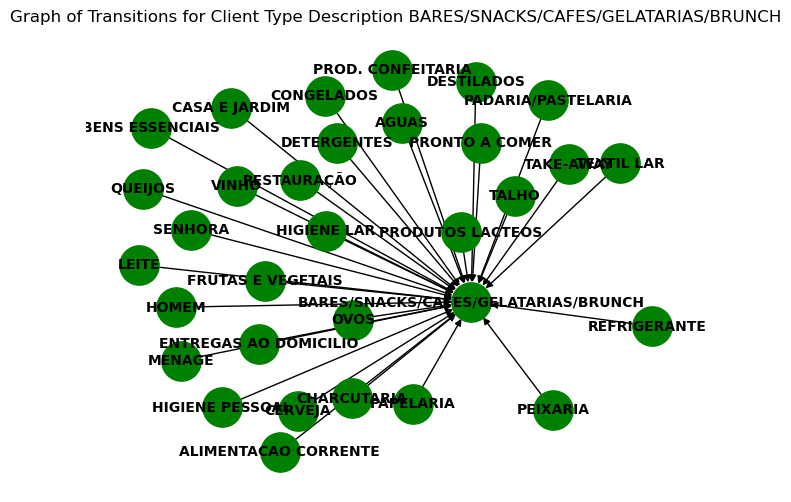

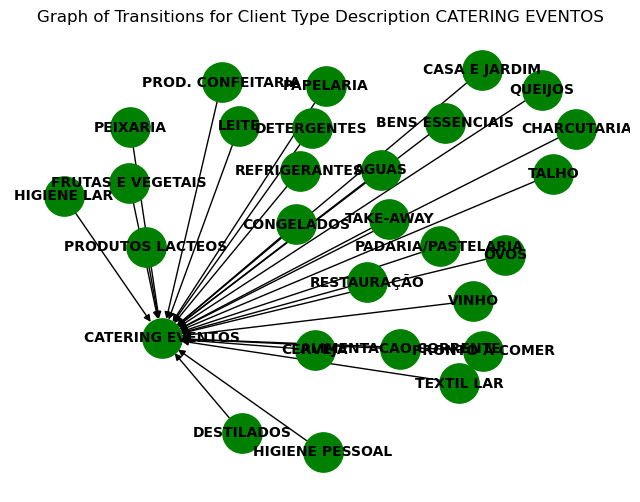

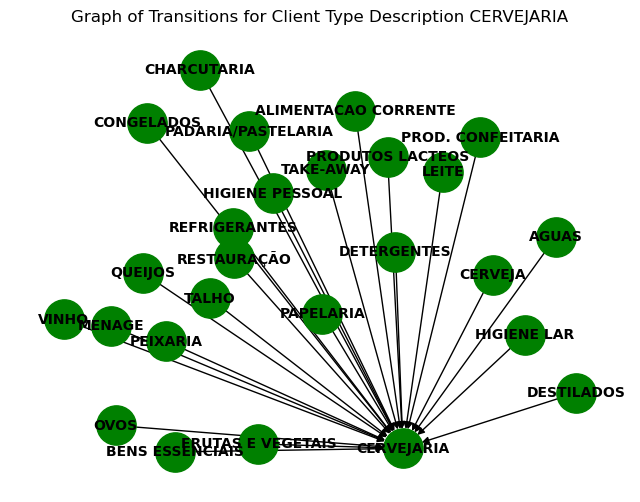

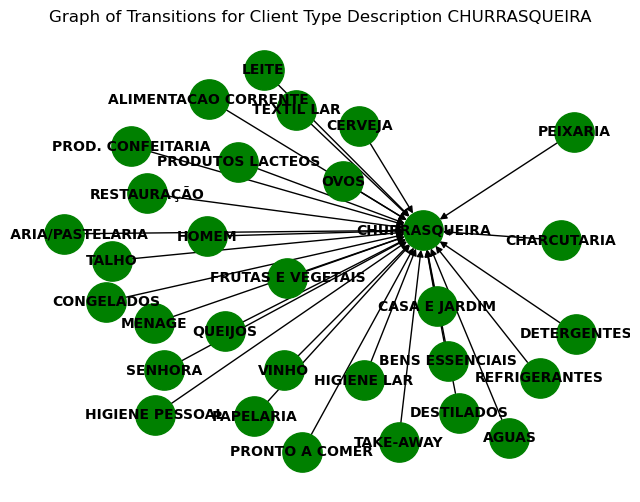

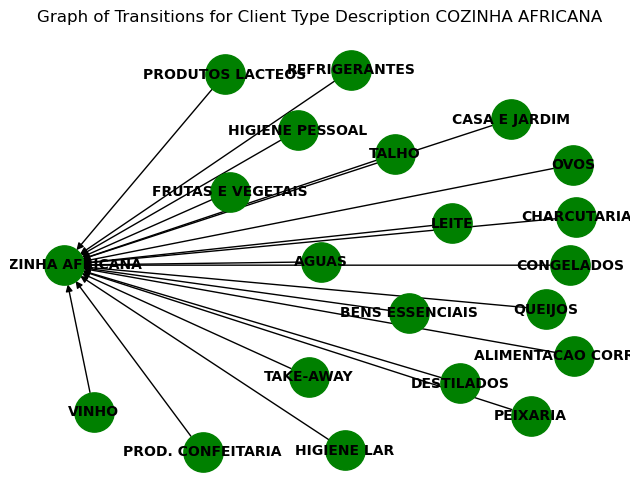

...

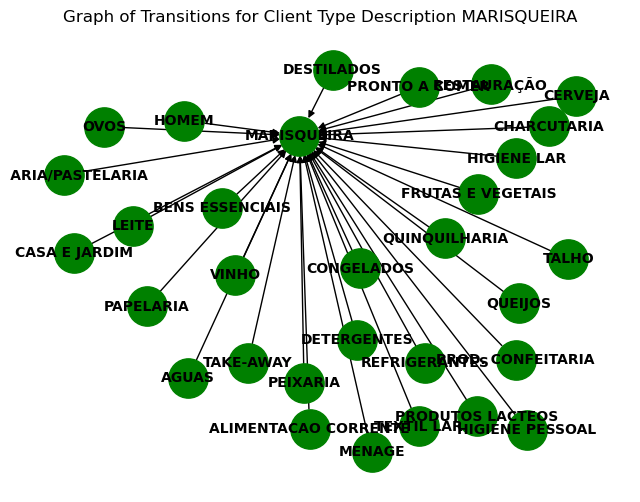

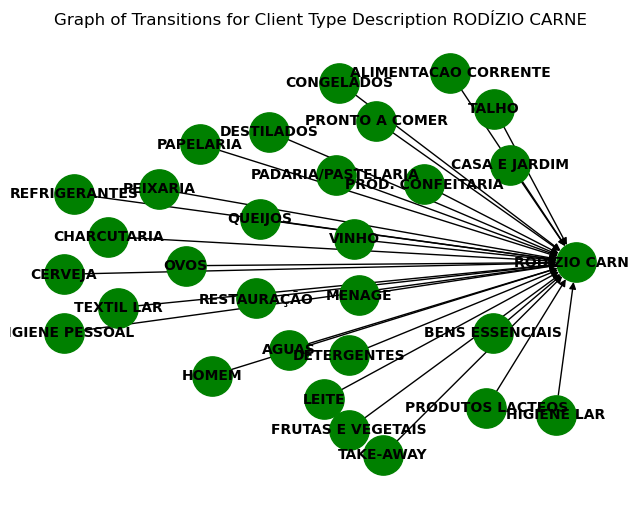

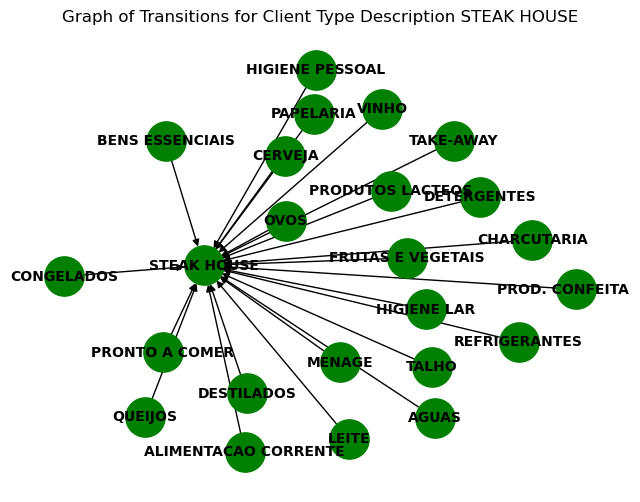

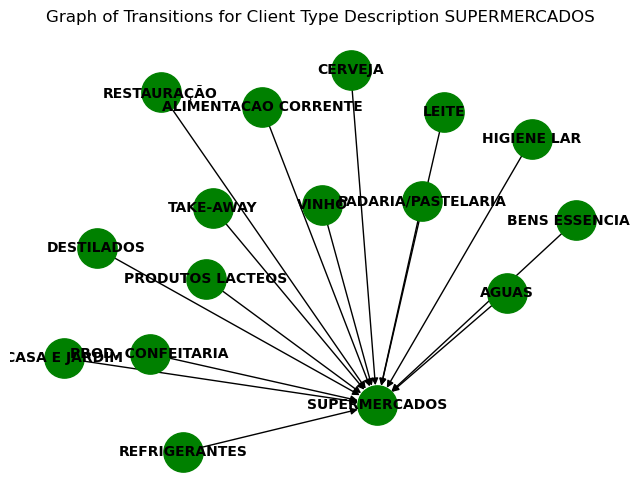

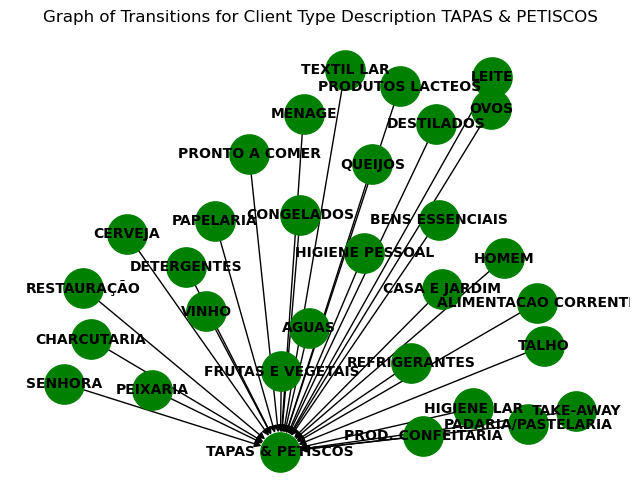

In [49]:
# Group transactions by Client ID
grouped_transactions = client_transactions.groupby('Client Type Description')

# Iterate over each client ID and create a graph
for client_id, transactions in grouped_transactions:
    # Create a graph representing transitions for the current client ID
    G = nx.DiGraph()
    for _, row in transactions.iterrows():
        G.add_edge(row['ID Product Category'], row['Client Type Description'])

    # Visualize the graph
    plt.figure(figsize=(8, 6))
    plt.title(f"Graph of Transitions for Client Type Description {client_id}")
    nx.draw(G, with_labels=True, node_size=800, node_color='green', font_size=10, font_weight='bold')
    plt.show()

#### Graph connecting each product category to the Client Type

Graphs showing links between client types and product categories.

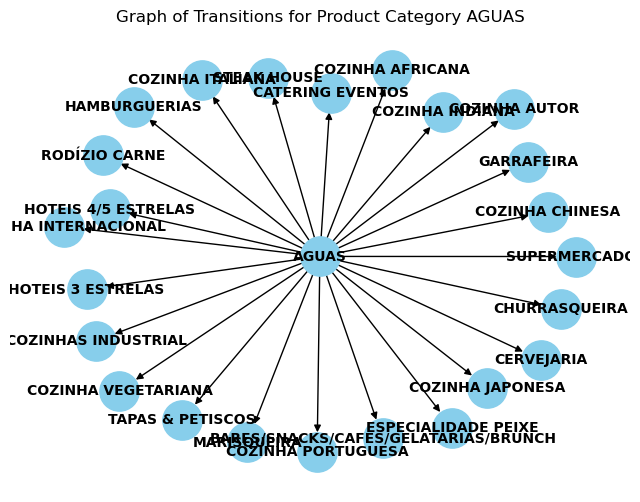

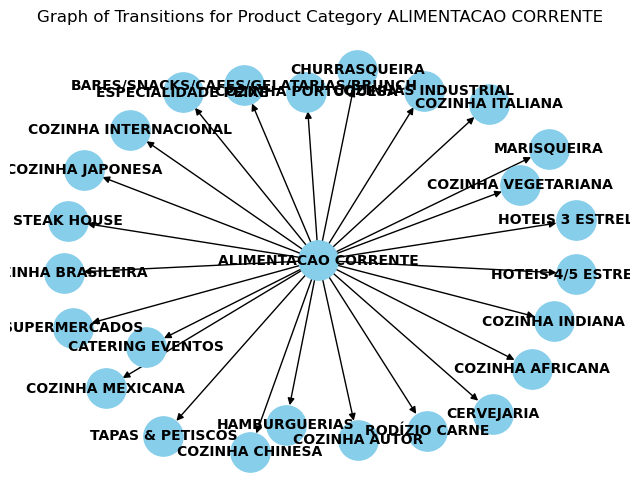

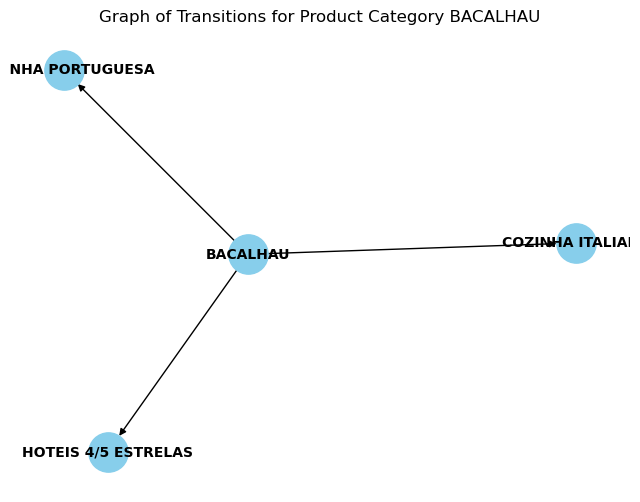

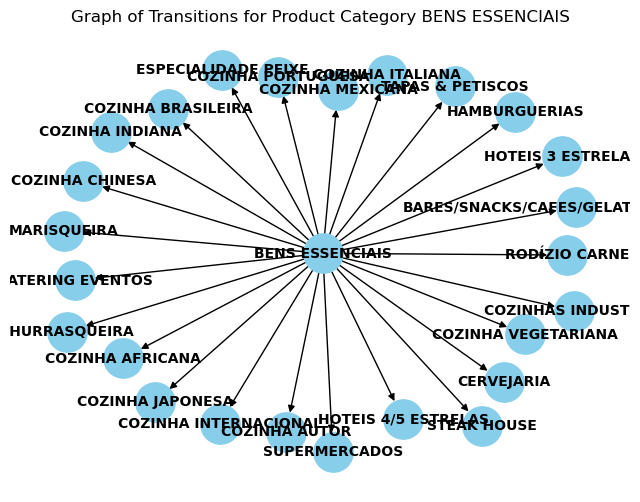

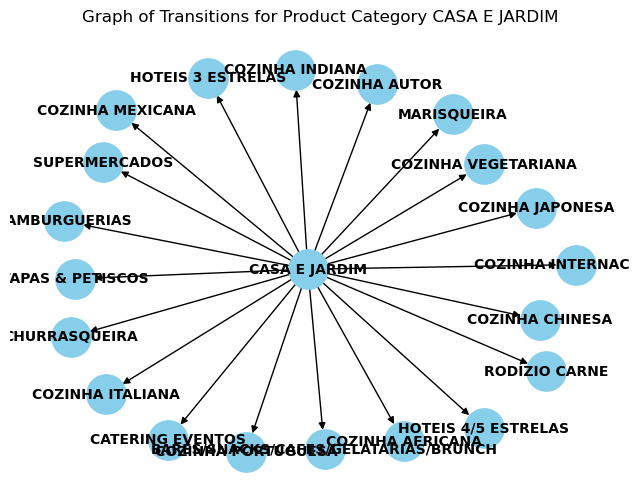

...

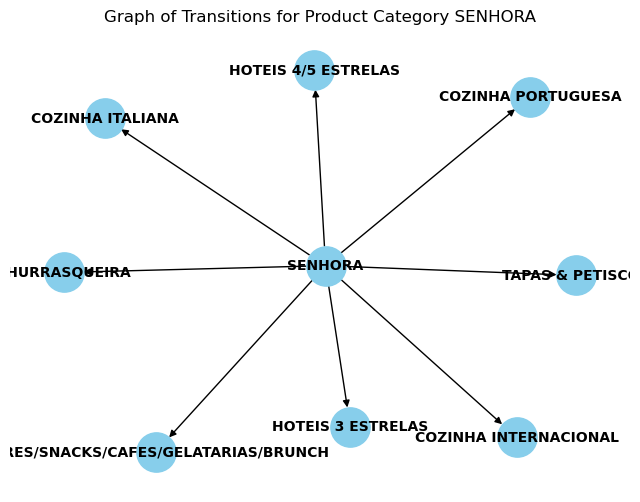

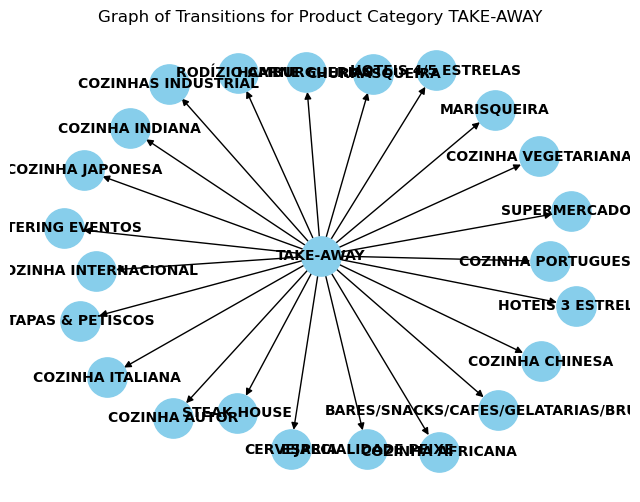

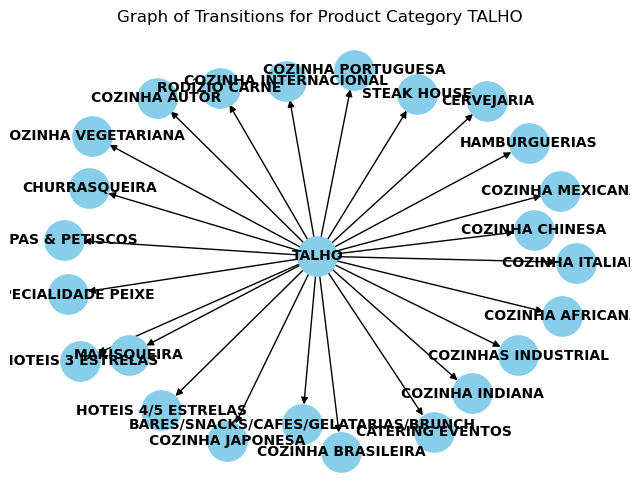

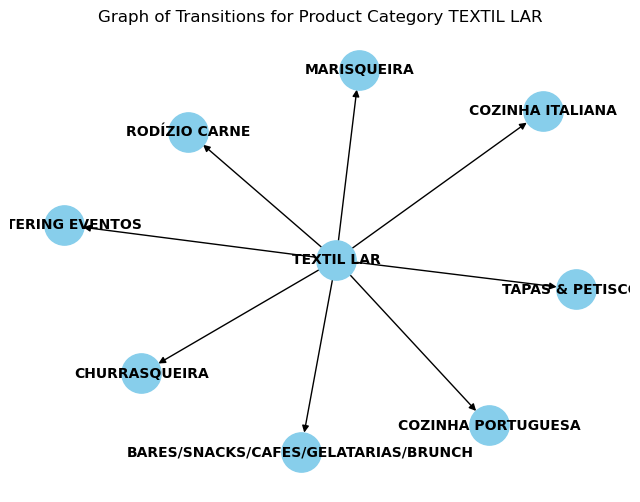

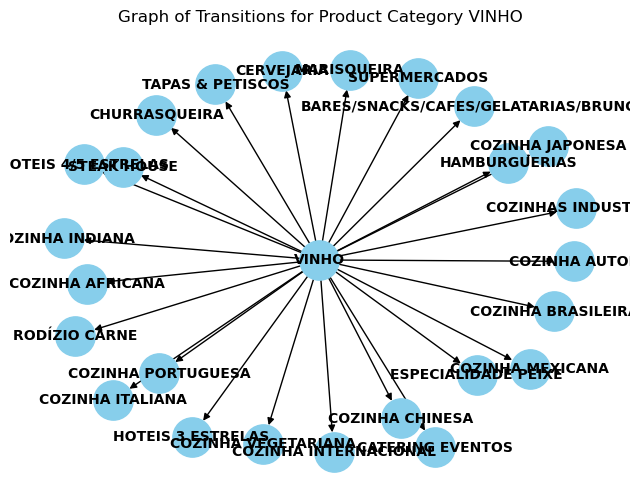

In [50]:
# Group transactions by Product Category
grouped_transactions = client_transactions.groupby('ID Product Category')

# Iterate over each product category and create a graph
for category, transactions in grouped_transactions:
    # Create a graph representing transitions for the current product category
    G = nx.DiGraph()
    for _, row in transactions.iterrows():
        G.add_edge(row['ID Product Category'], row['Client Type Description'])

    # Visualize the graph
    plt.figure(figsize=(8, 6))
    plt.title(f"Graph of Transitions for Product Category {category}")
    nx.draw(G, with_labels=True, node_size=800, node_color='skyblue', font_size=10, font_weight='bold')
    plt.show()

#### Recommendations by Product Category

Recommendations by Product Category for each Client Type

In [51]:
# Function to compute the transition matrix M
def getTeleMatrix(A, m):
    n = A.shape[1]
    S = np.ones((n, n)) / n
    return (1 - m) * A + m * S

# Function for the power method modified to compute the maximal real eigenvector
def powerMethod(A, x0, m, iter):
    n = A.shape[1]
    delta = m * (np.array([1] * n, dtype='float64') / n)
    for i in range(iter):
        x0 = np.dot((1 - m), np.dot(A, x0)) + delta
    return x0

# Group transactions by Client ID
grouped_transactions = client_transactions.groupby('Client Type Description')

# Iterate over each client ID and compute PageRank scores
for client_id, transactions in grouped_transactions:
    # Step 1: Create a graph representing transitions between product categories for the current client ID
    G = nx.DiGraph()
    for _, row in transactions.iterrows():
        G.add_edge(row['ID Product Category'], row['Client Type Description'])

    # Step 2: Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    # Step 3: Choose a damping factor
    damping_factor = 0.85  # Example damping factor

    # Step 4: Compute the transition matrix M
    tele_matrix = getTeleMatrix(adjacency_matrix, damping_factor)

    # Step 5: Apply the power method to compute the dominant eigenvector (PageRank scores)
    initial_vector = np.ones(tele_matrix.shape[0]) / tele_matrix.shape[0]  # Initialize with equal probabilities
    pagerank_scores = powerMethod(tele_matrix, initial_vector, damping_factor, iter=100)

    # Remove client ID from the list of nodes for recommendations
    nodes_for_recommendations = [node for node in G.nodes() if node != client_id]

    # Get the top 5 product categories based on PageRank scores
    top_categories = sorted(zip(nodes_for_recommendations, pagerank_scores), key=lambda x: x[1], reverse=True)[:10]

    # Print recommendations for the current client ID
    print(f"Recommendations for Client Type Description {client_id}")
    for category, score in top_categories:
        print(f"Product Category: {category}, PageRank Score: {score}")
    print()

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH
Product Category: BENS ESSENCIAIS, PageRank Score: 0.031228588733230016
Product Category: TAKE-AWAY, PageRank Score: 0.031228588733230016
Product Category: PROD. CONFEITARIA, PageRank Score: 0.031228588733230016
Product Category: PRONTO A COMER, PageRank Score: 0.031228588733230016
Product Category: LEITE, PageRank Score: 0.031228588733230016
Product Category: CONGELADOS, PageRank Score: 0.031228588733230016
Product Category: QUEIJOS, PageRank Score: 0.031228588733230016
Product Category: MENAGE, PageRank Score: 0.031228588733230016
Product Category: DESTILADOS, PageRank Score: 0.031228588733230016
Product Category: VINHO, PageRank Score: 0.031228588733230016

Recommendations for Client Type Description CATERING EVENTOS
Product Category: BENS ESSENCIAIS, PageRank Score: 0.03568929015885661
Product Category: TAKE-AWAY, PageRank Score: 0.03568929015885661
Product Category: CHARCUTARIA, PageRank Score: 0.0356

##### Coverage metric

In [52]:
    # Calculate coverage
    recommended_categories = [category for category, _ in top_categories]
    coverage_PR_ProductCategory = len(set(recommended_categories) & set(transactions['ID Product Category'].unique())) / len(transactions['ID Product Category'].unique())
    print("Coverage:", coverage_PR_ProductCategory)

Coverage: 0.3333333333333333


##### Novelty Score

In [53]:
# Initialize a list to store novelty scores for each client
novelty_scores = []

# Iterate over each client ID and compute PageRank scores
for client_id, purchase_counts in grouped_transactions:

    # Step 6: Calculate novelty score for the recommendations
    total_novelty_score = 0
    for description, _ in top_descriptions:
        if description in purchase_counts.columns:
            # Get the indices of the client's purchased items
            client_row_index = purchase_counts.index.get_loc(client_id)
            client_history = sparse_purchase_counts[client_row_index].toarray().flatten()
            purchased_indices = np.where(client_history > 0)[0]

            # Compute the average cosine similarity between the recommended description and all other descriptions
            similarity_to_other_descriptions = cosine_similarities[:, purchase_counts.columns.get_loc(description)]
            # Exclude descriptions the client has interacted with
            similarity_to_other_descriptions[purchased_indices] = 0
            # Calculate novelty score as the average similarity to other descriptions
            novelty_score = np.mean(similarity_to_other_descriptions)
            total_novelty_score += novelty_score
    
    # Calculate average novelty score for the recommendations
    average_novelty_score = total_novelty_score / len(top_descriptions)
    novelty_scores.append(average_novelty_score)

# Compute the average novelty score across all clients
overall_novelty_score_PR_PC = np.mean(novelty_scores)
print("Overall novelty score:", overall_novelty_score_PR_PC)

NameError: name 'top_descriptions' is not defined

#### Number of times the product categories are recommended together

In [54]:
# Function to compute the transition matrix M
def getTeleMatrix(A, m):
    n = A.shape[1]
    S = np.ones((n, n)) / n
    return (1 - m) * A + m * S

# Function for the power method modified to compute the maximal real eigenvector
def powerMethod(A, x0, m, iter):
    n = A.shape[1]
    delta = m * (np.array([1] * n, dtype='float64') / n)
    for i in range(iter):
        x0 = np.dot((1 - m), np.dot(A, x0)) + delta
    return x0

# Group transactions by Client ID
grouped_transactions = client_transactions.groupby('Client Type Description')

# Initialize an empty dictionary to store co-occurrence counts
co_occurrence_counts = {}

# Iterate over each client ID and compute PageRank scores
for client_id, transactions in grouped_transactions:
    # Step 1: Create a graph representing transitions between product categories for the current client ID
    G = nx.DiGraph()
    for _, row in transactions.iterrows():
        G.add_edge(row['ID Product Category'], row['Client Type Description'])

    # Step 2: Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    # Step 3: Choose a damping factor
    damping_factor = 0.85  # Example damping factor

    # Step 4: Compute the transition matrix M
    tele_matrix = getTeleMatrix(adjacency_matrix, damping_factor)

    # Step 5: Apply the power method to compute the dominant eigenvector (PageRank scores)
    initial_vector = np.ones(tele_matrix.shape[0]) / tele_matrix.shape[0]  # Initialize with equal probabilities
    pagerank_scores = powerMethod(tele_matrix, initial_vector, damping_factor, iter=100)

    # Remove client ID from the list of nodes for recommendations
    nodes_for_recommendations = [node for node in G.nodes() if node != client_id]

    # Get the top 5 product categories based on PageRank scores
    top_categories = sorted(zip(nodes_for_recommendations, pagerank_scores), key=lambda x: x[1], reverse=True)[:10]

    # Store the co-occurrence counts
    for i, (category_i, _) in enumerate(top_categories):
        for category_j, _ in top_categories[i + 1:]:
            co_occurrence_counts[(category_i, category_j)] = co_occurrence_counts.get((category_i, category_j), 0) + 1
            co_occurrence_counts[(category_j, category_i)] = co_occurrence_counts.get((category_j, category_i), 0) + 1

# Extract unique product categories from the DataFrame
all_categories = set(client_transactions['ID Product Category'])

# Convert sets to lists for index and columns
all_categories_list = list(all_categories)

# Create a DataFrame to represent the co-occurrence counts
co_occurrence_df = pd.DataFrame(0, index=all_categories_list, columns=all_categories_list)

# Fill the DataFrame with co-occurrence counts
for (category_i, category_j), count in co_occurrence_counts.items():
    co_occurrence_df.at[category_i, category_j] = count

# Set pandas display options to show all columns
pd.set_option('display.max_columns', None)    
    
# Display the co-occurrence DataFrame
co_occurrence_df

,VINHO,AGUAS,FRUTAS E VEGETAIS,DETERGENTES,QUEIJOS,BENS ESSENCIAIS,RESTAURAÇÃO,LEITE,TAKE-AWAY,PRODUTOS LACTEOS,HOMEM,TALHO,TEXTIL LAR,QUINQUILHARIA,CHARCUTARIA,OVOS,ENTREGAS AO DOMICILIO,PROD. CONFEITARIA,CASA E JARDIM,PEIXARIA,BACALHAU,CONGELADOS,DESTILADOS,PRONTO A COMER,ALIMENTACAO CORRENTE,REFRIGERANTES,MENAGE,PAPELARIA,PADARIA/PASTELARIA,CERVEJA,SENHORA,HIGIENE PESSOAL,HIGIENE LAR
VINHO,0,1,0,0,1,3,0,3,3,2,0,0,0,0,1,1,0,2,0,0,0,2,1,1,1,1,1,0,0,1,0,1,1
AGUAS,1,0,1,1,2,3,1,1,1,2,0,0,0,0,0,1,0,3,0,0,0,2,0,1,1,3,0,0,0,4,0,1,2
FRUTAS E VEGETAIS,0,1,0,2,8,14,3,11,8,10,0,8,0,0,10,7,0,10,1,4,0,12,0,4,0,2,2,0,1,2,0,1,5
DETERGENTES,0,1,2,0,3,4,0,2,0,2,0,3,0,0,3,1,0,2,0,1,0,4,0,1,0,0,1,0,0,2,0,1,3
QUEIJOS,1,2,8,3,0,17,3,15,8,13,0,6,0,0,12,10,0,12,1,2,0,16,2,7,0,1,1,2,2,3,0,2,4
BENS ESSENCIAIS,3,3,14,4,17,0,4,21,14,19,0,11,0,0,17,14,0,18,2,4,0,22,2,8,1,3,3,2,2,4,0,4,9
RESTAURAÇÃO,0,1,3,0,3,4,0,3,2,2,0,3,0,0,2,3,0,3,0,1,0,3,0,0,0,1,0,0,0,1,0,0,1
LEITE,3,1,11,2,15,21,3,0,13,17,0,9,0,0,16,12,0,15,1,3,0,18,2,6,1,1,2,2,2,2,0,4,7
TAKE-AWAY,3,1,8,0,8,14,2,13,0,11,0,6,0,0,10,8,0,9,1,1,0,11,1,4,1,2,2,1,2,1,0,2,4
PRODUTOS LACTEOS,2,2,10,2,13,19,2,17,11,0,0,7,0,0,14,11,0,14,2,2,0,16,1,7,1,2,1,2,2,3,0,3,5


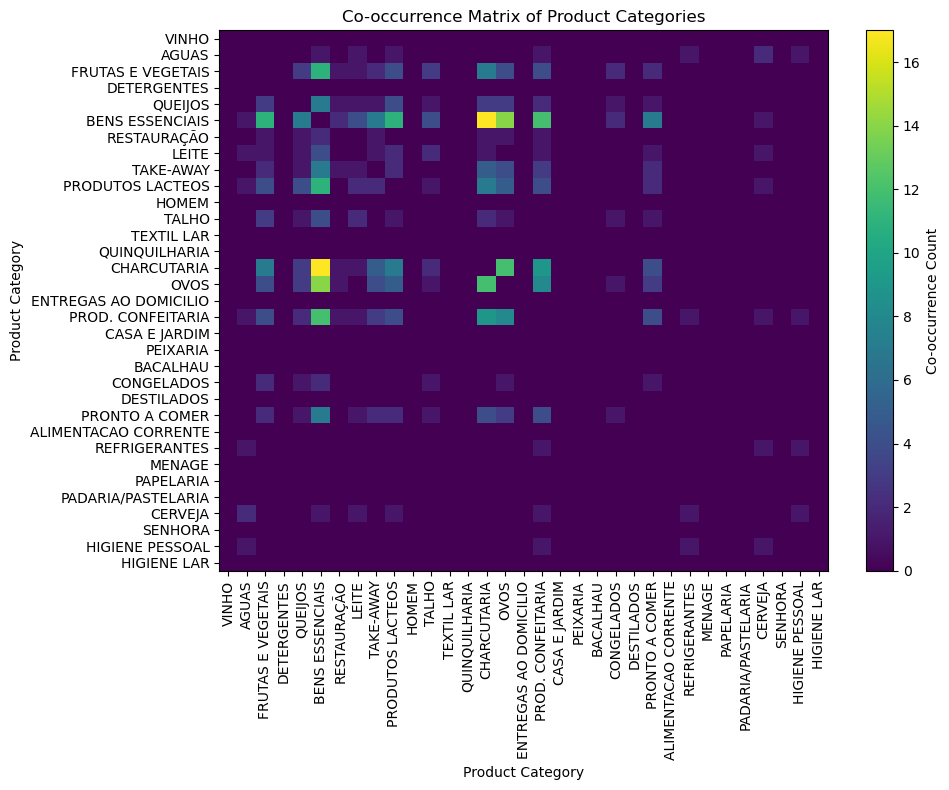

In [55]:
# Function to compute the transition matrix M
def getTeleMatrix(A, m):
    n = A.shape[1]
    S = np.ones((n, n)) / n
    return (1 - m) * A + m * S

# Function for the power method modified to compute the maximal real eigenvector
def powerMethod(A, x0, m, iter):
    n = A.shape[1]
    delta = m * (np.array([1] * n, dtype='float64') / n)
    for i in range(iter):
        x0 = np.dot((1 - m), np.dot(A, x0)) + delta
    return x0

# Group transactions by Client ID
grouped_transactions = client_transactions.groupby('Client Type Description')

# Initialize an empty dictionary to store co-occurrence counts
co_occurrence_counts = {}

# Iterate over each client ID and compute PageRank scores
for client_id, transactions in grouped_transactions:
    # Step 1: Create a graph representing transitions between product categories for the current client ID
    G = nx.DiGraph()
    for _, row in transactions.iterrows():
        G.add_edge(row['ID Product Category'], row['Client Type Description'])

    # Step 2: Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    # Step 3: Choose a damping factor
    damping_factor = 0.85  # Example damping factor

    # Step 4: Compute the transition matrix M
    tele_matrix = getTeleMatrix(adjacency_matrix, damping_factor)

    # Step 5: Apply the power method to compute the dominant eigenvector (PageRank scores)
    initial_vector = np.ones(tele_matrix.shape[0]) / tele_matrix.shape[0]  # Initialize with equal probabilities
    pagerank_scores = powerMethod(tele_matrix, initial_vector, damping_factor, iter=100)

    # Remove client ID from the list of nodes for recommendations
    nodes_for_recommendations = [node for node in G.nodes() if node != client_id]

    # Get the top 5 product categories based on PageRank scores
    top_categories = sorted(zip(nodes_for_recommendations, pagerank_scores), key=lambda x: x[1], reverse=True)[:5]

    # Store the co-occurrence counts
    for i, (category_i, _) in enumerate(top_categories):
        for category_j, _ in top_categories[i + 1:]:
            co_occurrence_counts[(category_i, category_j)] = co_occurrence_counts.get((category_i, category_j), 0) + 1
            co_occurrence_counts[(category_j, category_i)] = co_occurrence_counts.get((category_j, category_i), 0) + 1

# Convert sets to lists for index and columns
all_categories_list = list(all_categories)

# Create a DataFrame to represent the co-occurrence counts
co_occurrence_df = pd.DataFrame(0, index=all_categories_list, columns=all_categories_list)

# Fill the DataFrame with co-occurrence counts
for (category_i, category_j), count in co_occurrence_counts.items():
    co_occurrence_df.at[category_i, category_j] = count

# Define colormap for visualization
cmap = plt.cm.viridis  # You can choose any colormap you prefer

# Create a heatmap of the co-occurrence DataFrame with colormap
plt.figure(figsize=(10, 8))
plt.imshow(co_occurrence_df, cmap=cmap, aspect='auto')
plt.colorbar(label='Co-occurrence Count')
plt.xlabel('Product Category')
plt.ylabel('Product Category')
plt.title('Co-occurrence Matrix of Product Categories')
plt.xticks(np.arange(len(all_categories_list)), all_categories_list, rotation=90)
plt.yticks(np.arange(len(all_categories_list)), all_categories_list)
plt.tight_layout()
plt.show()

- The colormap shows the number of times that 2 Product Categories are bought together, the brightest color simbolize the products that are most associated/bought together.

#### Recommendations by Product Description

Recommendations by Product Description for each Client Type Description

In [56]:
# Function to compute the transition matrix M
def getTeleMatrix(A, m):
    n = A.shape[1]
    S = np.ones((n, n)) / n
    return (1 - m) * A + m * S

# Function for the power method modified to compute the maximal real eigenvector
def powerMethod(A, x0, m, iter):
    n = A.shape[1]
    delta = m * (np.array([1] * n, dtype='float64') / n)
    for i in range(iter):
        x0 = np.dot((1 - m), np.dot(A, x0)) + delta
    return x0

# Group transactions by Client ID
grouped_transactions = client_transactions.groupby('Client Type Description')

# Iterate over each client ID and compute PageRank scores
for client_id, transactions in grouped_transactions:
    # Step 1: Create a graph representing transitions between product descriptions for the current client ID
    G = nx.DiGraph()
    products = transactions['Product Description'].unique()
    G.add_nodes_from(products)
    for i in range(len(products)):
        for j in range(i+1, len(products)):
            G.add_edge(products[i], products[j])

    # Step 2: Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    # Step 3: Choose a damping factor
    damping_factor = 0.85  # Example damping factor

    # Step 4: Compute the transition matrix M
    tele_matrix = getTeleMatrix(adjacency_matrix, damping_factor)

    # Step 5: Apply the power method to compute the dominant eigenvector (PageRank scores)
    initial_vector = np.ones(tele_matrix.shape[0]) / tele_matrix.shape[0]  # Initialize with equal probabilities
    pagerank_scores = powerMethod(tele_matrix, initial_vector, damping_factor, iter=100)

    # Get the top 5 product descriptions based on PageRank scores
    top_descriptions = sorted(zip(G.nodes(), pagerank_scores), key=lambda x: x[1], reverse=True)[:10]

    # Print recommendations for the current client ID
    print(f"Recommendations for Client Type Description {client_id}")
    for description, score in top_descriptions:
        print(f"Product Description: {description}, PageRank Score: {score}")
    print()

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH
Product Description: ACUCAR MCHEF BRANCO PAPEL KG, PageRank Score: 2.445193167200342e+64
Product Description: ARROZ AGULHA MASTERCHEF 1 KG, PageRank Score: 2.433152063744681e+64
Product Description: ARROZ COZINHA VELHA AGULHA 1 KG, PageRank Score: 2.4211702554704285e+64
Product Description: MASSA AMANHECER ESPARGUETE 500GR, PageRank Score: 2.4092474503845349e+64
Product Description: MASSA AMANHECER PEVIDE 250GR, PageRank Score: 2.3973833579318375e+64
Product Description: FARINHA MCHEF S/FERMENTO 1KG, PageRank Score: 2.3855776889879848e+64
Product Description: SALSICHAS ALEMAS MASTERCHEF 8UN 1030G, PageRank Score: 2.3738301558523875e+64
Product Description: POLPA TOMATE MASTERCHEFF 1KG, PageRank Score: 2.3621404722412087e+64
Product Description: POLPA TOMATE GULOSO 1 L, PageRank Score: 2.350508353280388e+64
Product Description: POLPA TOMATE MCHEF TETRA 1L, PageRank Score: 2.3389335154986957e+64

Recommendat

##### Coverage metric

In [57]:
# Initialize a set to store all recommended items
recommended_items = set()

# Iterate over each client ID and compute PageRank scores
for client_id, transactions in grouped_transactions:
    # Step 1: Create a graph representing transitions between product categories for the current client ID
    G = nx.DiGraph()
    for _, row in transactions.iterrows():
        G.add_edge(row['Product Description'], row['Client Type Description'])

    # Step 2: Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    # Step 3: Choose a damping factor
    damping_factor = 0.85  # Example damping factor

    # Step 4: Compute the transition matrix M
    tele_matrix = getTeleMatrix(adjacency_matrix, damping_factor)

    # Step 5: Apply the power method to compute the dominant eigenvector (PageRank scores)
    initial_vector = np.ones(tele_matrix.shape[0]) / tele_matrix.shape[0]  # Initialize with equal probabilities
    pagerank_scores = powerMethod(tele_matrix, initial_vector, damping_factor, iter=100)

    # Remove client ID from the list of nodes for recommendations
    nodes_for_recommendations = [node for node in G.nodes() if node != client_id]

    # Get the top 5 product categories based on PageRank scores
    top_categories = sorted(zip(nodes_for_recommendations, pagerank_scores), key=lambda x: x[1], reverse=True)[:10]

    # Store recommended items in the set
    for category, _ in top_categories:
        recommended_items.add(category)

# Calculate coverage
coverage_PR_PD = len(recommended_items) / len(grouped_transactions['Product Description'].unique())

print("Coverage:", coverage_PR_PD)

Coverage: 5.115384615384615


##### Novelty Score

In [58]:
# Initialize a list to store novelty scores for each client
novelty_scores = []

# Iterate over each client ID and compute PageRank scores
for client_id, purchase_counts in grouped_transactions:

    # Step 6: Calculate novelty score for the recommendations
    total_novelty_score = 0
    for description, _ in top_descriptions:
        if description in purchase_counts.columns:
            # Get the indices of the client's purchased items
            client_row_index = purchase_counts.index.get_loc(client_id)
            client_history = sparse_purchase_counts[client_row_index].toarray().flatten()
            purchased_indices = np.where(client_history > 0)[0]

            # Compute the average cosine similarity between the recommended description and all other descriptions
            similarity_to_other_descriptions = cosine_similarities[:, purchase_counts.columns.get_loc(description)]
            # Exclude descriptions the client has interacted with
            similarity_to_other_descriptions[purchased_indices] = 0
            # Calculate novelty score as the average similarity to other descriptions
            novelty_score = np.mean(similarity_to_other_descriptions)
            total_novelty_score += novelty_score
    
    # Calculate average novelty score for the recommendations
    average_novelty_score = total_novelty_score / len(top_descriptions)
    novelty_scores.append(average_novelty_score)

# Compute the average novelty score across all clients
overall_novelty_score = np.mean(novelty_scores)
print("Overall novelty score:", overall_novelty_score)

Overall novelty score: 0.0


#### Recommendations of Product Categories that haven't been consumed by Client Type 

In [59]:
def recommend_for_client(client_id, client_transactions):
    # Filter transactions for the current client ID
    client_data = client_transactions[client_transactions['Client Type Description'] == client_id]
    
    # Get the set of product categories bought by the client
    bought_categories = set(client_data['ID Product Category'])
    
    # Create a set of all product categories
    all_categories = set(client_transactions['ID Product Category'])
    
    # Determine product categories not bought by the client
    remaining_categories = all_categories - bought_categories
    
    # Create a graph representing transitions between remaining product categories
    G = nx.DiGraph()
    for category in remaining_categories:
        G.add_edge(category, client_id)
    
    # Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)
    
    # Choose a damping factor
    damping_factor = 0.85  # Example damping factor
    
    # Compute the transition matrix M
    tele_matrix = getTeleMatrix(adjacency_matrix, damping_factor)
    
    # Apply the power method to compute the dominant eigenvector (PageRank scores)
    initial_vector = np.ones(tele_matrix.shape[0]) / tele_matrix.shape[0]  # Initialize with equal probabilities
    pagerank_scores = powerMethod(tele_matrix, initial_vector, damping_factor, iter=100)
    
    # Get the top 10 product categories based on PageRank scores
    top_categories = sorted(zip(remaining_categories, pagerank_scores), key=lambda x: x[1], reverse=True)[:10]
    
    # Fill the remaining recommendations with categories having the highest PageRank scores among the ones already recommended
    if len(top_categories) < 10:
        top_categories.extend(sorted(zip(bought_categories, pagerank_scores), key=lambda x: x[1], reverse=True)[:10 - len(top_categories)])
    
    # Print recommendations for the current client ID
    print(f"Recommendations for Client Type Description {client_id}")
    for category, score in top_categories:
        print(f"Product Category: {category}, PageRank Score: {score}")
    print()

# Loop through each client ID in ascending order and generate recommendations
for client_id in sorted(client_transactions['Client Type Description'].unique()):
    recommend_for_client(client_id, client_transactions)

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH
Product Category: QUINQUILHARIA, PageRank Score: 0.3327733666441723
Product Category: BACALHAU, PageRank Score: 0.32545072532437386
Product Category: VINHO, PageRank Score: 0.3327733666441723
Product Category: FRUTAS E VEGETAIS, PageRank Score: 0.3327733666441723
Product Category: AGUAS, PageRank Score: 0.32545072532437386

Recommendations for Client Type Description CATERING EVENTOS
Product Category: QUINQUILHARIA, PageRank Score: 0.14270672772016096
Product Category: SENHORA, PageRank Score: 0.14270672772016096
Product Category: ENTREGAS AO DOMICILIO, PageRank Score: 0.14270672772016096
Product Category: BACALHAU, PageRank Score: 0.14270672772016096
Product Category: HOMEM, PageRank Score: 0.14270672772016096
Product Category: MENAGE, PageRank Score: 0.13956648187790804
Product Category: VINHO, PageRank Score: 0.14270672772016096
Product Category: FRUTAS E VEGETAIS, PageRank Score: 0.14270672772016096
Pr

Understand why it does't recommend new product categories fo Client Type Cozinha Portugesa: 

In [60]:
# Filter transactions of the client with ID 201 - COZINHA PORTUGUESA
client_201_transactions = client_transactions[client_transactions['ID Client Type'] == 201]

# Check unique product categories for client 201
unique_categories_client_201 = client_201_transactions['ID Product Category'].unique()

# Get unique product categories in the entire dataset
unique_categories_all = client_transactions['ID Product Category'].unique()

# Check if client 201 has bought from all product categories
if len(unique_categories_client_201) == len(unique_categories_all):
    print("Client 201 (COZINHA PORTUGUESA) has bought from all product categories, therefore there aren't new categories to recommend.")
else:
    print("Client 201 has not bought from all product categories.")

Client 201 (COZINHA PORTUGUESA) has bought from all product categories, therefore there aren't new categories to recommend.


#### Recommendations of Product Description that haven't been consumed by Client Type

In [61]:
# Function to generate recommendations for a specific client ID
def recommend_for_client_by_description(client_id, client_transactions):
    # Filter transactions for the current client ID
    client_data = client_transactions[client_transactions['Client Type Description'] == client_id]

    # Get the set of product descriptions bought by the client
    bought_descriptions = set(client_data['Product Description'])

    # Create a set of all product descriptions
    all_descriptions = set(client_transactions['Product Description'])

    # Determine product descriptions not bought by the client
    remaining_descriptions = all_descriptions - bought_descriptions

    # Create a graph representing transitions between remaining product descriptions
    G = nx.DiGraph()
    for description in remaining_descriptions:
        G.add_edge(description, client_id)

    # Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    # Choose a damping factor
    damping_factor = 0.85  # Example damping factor

    # Compute the transition matrix M
    tele_matrix = getTeleMatrix(adjacency_matrix, damping_factor)

    # Apply the power method to compute the dominant eigenvector (PageRank scores)
    initial_vector = np.ones(tele_matrix.shape[0]) / tele_matrix.shape[0]  # Initialize with equal probabilities
    pagerank_scores = powerMethod(tele_matrix, initial_vector, damping_factor, iter=100)

    # Get the top 5 product descriptions based on PageRank scores
    top_descriptions = sorted(zip(remaining_descriptions, pagerank_scores), key=lambda x: x[1], reverse=True)[:10]

    # Print recommendations for the current client ID
    print(f"Recommendations for Client Type Description {client_id}")
    for description, score in top_descriptions:
        print(f"Product Description: {description}, PageRank Score: {score}")
    print()

# Loop through each client ID in ascending order and generate recommendations
for client_id in sorted(client_transactions['Client Type Description'].unique()):
    recommend_for_client_by_description(client_id, client_transactions)

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH
Product Description: CHOC.BACI 3KG, PageRank Score: 0.0006988919938414077
Product Description: ATUM COMBATE MIGAS GIR.BOLS 1K, PageRank Score: 0.0006988919938414077
Product Description: CHALLOTTE ROXO RCH, PageRank Score: 0.0006988919938414077
Product Description: ROSMANINHO EMB 100G PLT, PageRank Score: 0.0006988919938414077
Product Description: LAGOSTA METADES RCH CONG, PageRank Score: 0.0006988919938414077
Product Description: GRAO BICO AMANHECER F.540GR, PageRank Score: 0.0006988919938414077
Product Description: V. PORTO BURMESTER WHITE 75 CL, PageRank Score: 0.0006988919938414077
Product Description: SUMO ARANDO CRANBERRY ANDROS PET1L, PageRank Score: 0.0006988919938414077
Product Description: MASSA MILANEZA LINGUINE 500 GR, PageRank Score: 0.0006988919938414077
Product Description: MASSA BARILLA PENNE TRICOLOR 5KG, PageRank Score: 0.0006988919938414077

Recommendations for Client Type Description CAT

#### Recommendations with product description by Cluster

Using the clusters obtained above with K-Means.

In [62]:
# Function to compute the transition matrix M
def getTeleMatrix(A, m):
    n = A.shape[1]
    S = np.ones((n, n)) / n
    return (1 - m) * A + m * S

# Function for the power method modified to compute the maximal real eigenvector
def powerMethod(A, x0, m, iter):
    n = A.shape[1]
    delta = m * (np.array([1] * n, dtype='float64') / n)
    for i in range(iter):
        x0 = np.dot((1 - m), np.dot(A, x0)) + delta
    return x0

# Iterate over each cluster and compute recommendations
for cluster_id in df_clustering['Cluster'].unique():
    # Filter transactions for the current cluster
    cluster_df = df_clustering[df_clustering['Cluster'] == cluster_id].copy()

    # Step 1: Create a graph representing transitions between product descriptions for the current cluster
    G = nx.DiGraph()
    products = cluster_df['Product Description'].unique()
    G.add_nodes_from(products)
    for i in range(len(products)):
        for j in range(i+1, len(products)):
            G.add_edge(products[i], products[j])

    # Step 2: Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    # Step 3: Choose a damping factor
    damping_factor = 0.85  # Example damping factor

    # Step 4: Compute the transition matrix M
    tele_matrix = getTeleMatrix(adjacency_matrix, damping_factor)

    # Step 5: Apply the power method to compute the dominant eigenvector (PageRank scores)
    initial_vector = np.ones(tele_matrix.shape[0]) / tele_matrix.shape[0]  # Initialize with equal probabilities
    pagerank_scores = powerMethod(tele_matrix, initial_vector, damping_factor, iter=100)

    # Get the top 5 product descriptions based on PageRank scores
    top_descriptions = sorted(zip(G.nodes(), pagerank_scores), key=lambda x: x[1], reverse=True)[:10]

    # Print recommendations for the current cluster
    print(f"Recommendations for Cluster {cluster_id}:")
    for description, score in top_descriptions:
        print(f"Product Description: {description}, PageRank Score: {score}")
    print()

Recommendations for Cluster 0:
Product Description: ACUCAR MCHEF BRANCO PAPEL KG, PageRank Score: 6.362615715585096e+86
Product Description: AÇÚCAR SIDUL AMARELO 1KG, PageRank Score: 6.343917314954681e+86
Product Description: ARROZ CAÇAROLA AGULHA 1 KG, PageRank Score: 6.325273865024068e+86
Product Description: ARROZ COZINHA VELHA AGULHA 1 KG, PageRank Score: 6.306685204304609e+86
Product Description: SAL MCHEF GROSSO KG, PageRank Score: 6.28815117178224e+86
Product Description: VINAGRE BR M CHEF 1LT, PageRank Score: 6.269671606916081e+86
Product Description: MASSA AMANHECER ESPARGUETE 500GR, PageRank Score: 6.251246349637053e+86
Product Description: MASSA MILANEZA LASANHA C/OVO 500G, PageRank Score: 6.23287524034648e+86
Product Description: MASSA MCHEF FARFALLE 500GR, PageRank Score: 6.21455811991472e+86
Product Description: MASSA  MCHEF FUSILLI  500GR, PageRank Score: 6.196294829679773e+86

Recommendations for Cluster 4:
Product Description: ACUCAR MCHEF BRANCO PAPEL KG, PageRank Sco

##  Collaborative Filtering

Collaborative filtering is a technique widely used as a recommender system. The basic idea of CF-based algorithms is to provide item recommendations or predictions based on the opinions of other like-minded users (Sarwar et al., 2001).
- In terms of this project, the use of a collaborative filtering algorithm is to suggest new items or to predict the utility of a certain item for a particular client based on their previous purchases and the purchases of other like-minded clients. There are different types of collaborative systems, however, in the scope of this project, it was decided to use the item-based Cosine Similarity (described below), the Singular Value Decomposition and a Correlation-based Similarity.
- Evaluation metrics: novelty refers to how diverse or unique the recommendations are, and coverage measures the extent to which a recommender system is able to recommend items from the entire dataset.


### Item-based Cosine Similarity

Using similarity measure - Cosine Similarity

#### Recommendations with product categories by Client Type

In [63]:
# Load the purchase history data into a DataFrame 
purchase_history = client_transactions

# Count the number of purchases for each client and product combination
purchase_counts = purchase_history.groupby(['Client Type Description', 'ID Product Category']).size().unstack(fill_value=0)

# Convert the purchase counts to a sparse matrix
sparse_purchase_counts = sparse.csr_matrix(purchase_counts)

# Compute the cosine similarity matrix between the products
cosine_similarities = cosine_similarity(sparse_purchase_counts.T)

# Define a function to recommend items for a client based on their purchase history
def recommend_items(client_id, n=10):
    if client_id not in purchase_counts.index:
        print(f"client {client_id} does not exist in the dataset.")
        return []

    # Get the client's purchase history
    client_row_index = purchase_counts.index.get_loc(client_id)
    client_history = sparse_purchase_counts[client_row_index].toarray().flatten()

    # Compute the average cosine similarity between the client's purchased items and all other items
    similarities = cosine_similarities.dot(client_history)

    # Get the indices of the client's purchased items
    purchased_indices = np.where(client_history > 0)[0]

    # Set the similarity scores for purchased items to 0
    similarities[purchased_indices] = 0

    # Sort the items by similarity score and return the top n items
    recommended_indices = np.argsort(similarities)[::-1][:n]
    recommended_items = list(purchase_counts.columns[recommended_indices])

    return recommended_items

# Loop through all client IDs and print recommendations
for client_id in purchase_counts.index:
    recommendations = recommend_items(client_id, n=10)  
    if recommendations:
        print(f"Recommendations for Client Type Description {client_id}: {recommendations}")
    else:
        print(f"No recommendations available for client {client_id}.")

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ['BACALHAU', 'QUINQUILHARIA', 'VINHO', 'DESTILADOS', 'HIGIENE PESSOAL', 'HIGIENE LAR', 'FRUTAS E VEGETAIS', 'ENTREGAS AO DOMICILIO', 'DETERGENTES', 'CHARCUTARIA']
Recommendations for Client Type Description CATERING EVENTOS: ['MENAGE', 'BACALHAU', 'ENTREGAS AO DOMICILIO', 'QUINQUILHARIA', 'HOMEM', 'SENHORA', 'DESTILADOS', 'HIGIENE LAR', 'FRUTAS E VEGETAIS', 'DETERGENTES']
Recommendations for Client Type Description CERVEJARIA: ['PRONTO A COMER', 'CASA E JARDIM', 'BACALHAU', 'ENTREGAS AO DOMICILIO', 'TEXTIL LAR', 'QUINQUILHARIA', 'HOMEM', 'SENHORA', 'BENS ESSENCIAIS', 'CERVEJA']
Recommendations for Client Type Description CHURRASQUEIRA: ['BACALHAU', 'ENTREGAS AO DOMICILIO', 'QUINQUILHARIA', 'VINHO', 'DESTILADOS', 'HIGIENE PESSOAL', 'HIGIENE LAR', 'FRUTAS E VEGETAIS', 'DETERGENTES', 'CHARCUTARIA']
Recommendations for Client Type Description COZINHA AFRICANA: ['DETERGENTES', 'MENAGE', 'PRONTO A COMER', 'PAPE

##### Coverage metric

In [64]:
# Initialize a set to store all recommended items
all_recommended_items = set()

# Loop through all client IDs and collect recommended items
for client_id in purchase_counts.index:
    recommendations = recommend_items(client_id, n=10)  
    all_recommended_items.update(recommendations)

# Calculate the coverage as the ratio of unique recommended items to the total number of unique items in the catalog
coverage_CS = len(all_recommended_items) / len(purchase_counts.columns)

print(f"Coverage: {coverage_CS}")

Coverage: 0.9090909090909091


##### Novelty score

In [65]:
# Define a function to calculate the novelty score for the entire system
def calculate_novelty_for_system(recommended_items):
    total_similarity = 0
    num_recommendations = len(recommended_items)
    
    # Compute the similarity between recommended items and all purchase history
    for client_id in purchase_counts.index:
        client_row_index = purchase_counts.index.get_loc(client_id)
        client_history = sparse_purchase_counts[client_row_index].toarray().flatten()

        similarities = cosine_similarities.dot(client_history)
        total_similarity += np.sum(similarities)
    
    # Calculate the average similarity score (novelty score) for all recommendations
    if num_recommendations > 0:
        novelty_score = total_similarity / num_recommendations
    else:
        novelty_score = 0
    
    return novelty_score

# Calculate recommendations for all clients
all_recommendations = []
for client_id in purchase_counts.index:
    recommendations = recommend_items(client_id, n=10)
    all_recommendations.extend(recommendations)

# Calculate novelty score for the entire system
novelty_score_system = calculate_novelty_for_system(all_recommendations)
print(f"Novelty score for the entire system: {novelty_score_system}")


Novelty score for the entire system: 25108.902875815624


#### Recommendations with product description by Client Type

In [66]:
# Load the purchase history data into a DataFrame 
purchase_history = client_transactions

# Count the number of purchases for each client and product combination
purchase_counts = purchase_history.groupby(['Client Type Description', 'Product Description']).size().unstack(fill_value=0)

# Convert the purchase counts to a sparse matrix
sparse_purchase_counts = sparse.csr_matrix(purchase_counts)

# Compute the cosine similarity matrix between the products
cosine_similarities = cosine_similarity(sparse_purchase_counts.T)

# Define a function to recommend items for a client based on their purchase history
def recommend_items(client_id, n=5):
    if client_id not in purchase_counts.index:
        print(f"client {client_id} does not exist in the dataset.")
        return []

    # Get the client's purchase history
    client_row_index = purchase_counts.index.get_loc(client_id)
    client_history = sparse_purchase_counts[client_row_index].toarray().flatten()

    # Compute the average cosine similarity between the client's purchased items and all other items
    similarities = cosine_similarities.dot(client_history)

    # Get the indices of the client's purchased items
    purchased_indices = np.where(client_history > 0)[0]

    # Set the similarity scores for purchased items to 0
    similarities[purchased_indices] = 0

    # Sort the items by similarity score and return the top n items
    recommended_indices = np.argsort(similarities)[::-1][:n]
    recommended_items = list(purchase_counts.columns[recommended_indices])

    return recommended_items

# Loop through all client IDs and print recommendations
for client_id in purchase_counts.index:
    recommendations = recommend_items(client_id)
    if recommendations:
        print(f"Recommendations for Client Type Description {client_id}: {recommendations}")
    else:
        print(f"No recommendations available for client {client_id}.")

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ['V.DAO CASA SANTAR TTO 37,5CL', 'PORCO ENTREMEADA COM ENTRECOSTO RCH', 'SALMAO 6/7 PLT CX 1 UN KG', 'FILETES PESCADA SACO KG CONG', 'V.ERM.FREITAS TTO BIB 5LT']
Recommendations for Client Type Description CATERING EVENTOS: ['PALITOS GOURMES EMB.IND.850UN', 'REF GINGER ALE SCHWEPPES TP 25CL', 'BEB ESPIRITUOSA MACIEIRA 1LT', 'BOL RECH OREO TUBO ORIGIN 154G', 'LEITE UHT MGORDO PRADO VERDE 1LT']
Recommendations for Client Type Description CERVEJARIA: ['REF COCA COLA ZERO LATA 33CL', 'PALITOS GOURMES EMB.IND.850UN', 'REF 7UP ORIGINAL LATA 33CL', 'CARAMELO LÍQUIDO MCHEF 1,3KG', 'ÁGUA TÓNICA SCHWEPPES ORIGINAL TP 25CL']
Recommendations for Client Type Description CHURRASQUEIRA: ['CURGETE RCH', 'KETCHUP MCHEF  KG', 'SABONETE CREME LIQUIDO BRANCO MCHEF 5LT', 'MOLHO SOJA GULOSO 1L', 'QUEIJO PASTASAN 1KG']
Recommendations for Client Type Description COZINHA AFRICANA: ['CANELA MCHEF PAU SC 500GR', 'AZEITE PINGO D`OU

In [67]:
cosine_similarities

array([[1.        , 0.36980013, 0.40406102, ..., 0.        , 0.        ,
        0.        ],
       [0.36980013, 1.        , 0.9992584 , ..., 0.02234951, 0.06821562,
        0.06778765],
       [0.40406102, 0.9992584 , 1.        , ..., 0.02442012, 0.0745356 ,
        0.07406798],
       ...,
       [0.        , 0.02234951, 0.02442012, ..., 1.        , 0.17837652,
        0.17725742],
       [0.        , 0.06821562, 0.0745356 , ..., 0.17837652, 1.        ,
        0.68530303],
       [0.        , 0.06778765, 0.07406798, ..., 0.17725742, 0.68530303,
        1.        ]])

##### Coverage metric

In [68]:
# Initialize a set to store all recommended items
all_recommended_items = set()

# Loop through all client IDs and collect recommended items
for client_id in purchase_counts.index:
    recommendations = recommend_items(client_id, n=10)  
    all_recommended_items.update(recommendations)

# Calculate the coverage as the ratio of unique recommended items to the total number of unique items in the catalog
coverage = len(all_recommended_items) / len(purchase_counts.columns)

print(f"Coverage: {coverage}")

Coverage: 0.05742971887550201


##### Novelty score

In [69]:
# Define a function to calculate the novelty score for the entire system
def calculate_novelty_for_system(recommended_items):
    total_similarity = 0
    num_recommendations = len(recommended_items)
    
    # Compute the similarity between recommended items and all purchase history
    for client_id in purchase_counts.index:
        client_row_index = purchase_counts.index.get_loc(client_id)
        client_history = sparse_purchase_counts[client_row_index].toarray().flatten()

        similarities = cosine_similarities.dot(client_history)
        total_similarity += np.sum(similarities)
    
    # Calculate the average similarity score (novelty score) for all recommendations
    if num_recommendations > 0:
        novelty_score = total_similarity / num_recommendations
    else:
        novelty_score = 0
    
    return novelty_score

# Calculate recommendations for all clients
all_recommendations = []
for client_id in purchase_counts.index:
    recommendations = recommend_items(client_id, n=10)
    all_recommendations.extend(recommendations)

# Calculate novelty score for the entire system
novelty_score_system = calculate_novelty_for_system(all_recommendations)
print(f"Novelty score for the entire system: {novelty_score_system}")

Novelty score for the entire system: 906141.8007831186


#### Recommendations of Product Categories that haven't been consumed by Client Type

In [70]:
# Load the purchase history data into a DataFrame 
purchase_history = client_transactions

# Count the number of purchases for each client and product combination
purchase_counts = purchase_history.groupby(['Client Type Description', 'ID Product Category']).size().unstack(fill_value=0)

# Convert the purchase counts to a sparse matrix
sparse_purchase_counts = sparse.csr_matrix(purchase_counts)

# Compute the cosine similarity matrix between the products
cosine_similarities = cosine_similarity(sparse_purchase_counts.T)

# Define a function to recommend items for a client based on their purchase history
def recommend_items(client_id, n=10):
    if client_id not in purchase_counts.index:
        print(f"client {client_id} does not exist in the dataset.")
        return []

    # Get the client's purchase history
    client_row_index = purchase_counts.index.get_loc(client_id)
    client_history = sparse_purchase_counts[client_row_index].toarray().flatten()

    # Compute the average cosine similarity between the client's purchased items and all other items
    similarities = cosine_similarities.dot(client_history)

    # Get the indices of the client's purchased items
    purchased_indices = np.where(client_history > 0)[0]

    # Set the similarity scores for purchased items to 0
    similarities[purchased_indices] = 0

    # Sort the items by similarity score and return the top n items
    recommended_indices = np.argsort(similarities)[::-1][:n]
    recommended_items = list(purchase_counts.columns[recommended_indices])

    # Remove the items that the client has already purchased
    purchased_items = list(purchase_counts.columns[purchase_counts.loc[client_id] > 0])
    recommended_items = [item for item in recommended_items if item not in purchased_items]

    return recommended_items

# Loop through all client IDs and print recommendations
for client_id in purchase_counts.index:
    recommendations = recommend_items(client_id, n=10)  
    if recommendations:
        print(f"Recommendations for Client Type Description {client_id}: {recommendations}")
    else:
        print(f"No recommendations available for client {client_id}.")

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ['BACALHAU', 'QUINQUILHARIA']
Recommendations for Client Type Description CATERING EVENTOS: ['MENAGE', 'BACALHAU', 'ENTREGAS AO DOMICILIO', 'QUINQUILHARIA', 'HOMEM', 'SENHORA']
Recommendations for Client Type Description CERVEJARIA: ['PRONTO A COMER', 'CASA E JARDIM', 'BACALHAU', 'ENTREGAS AO DOMICILIO', 'TEXTIL LAR', 'QUINQUILHARIA', 'HOMEM', 'SENHORA']
Recommendations for Client Type Description CHURRASQUEIRA: ['BACALHAU', 'ENTREGAS AO DOMICILIO', 'QUINQUILHARIA']
Recommendations for Client Type Description COZINHA AFRICANA: ['DETERGENTES', 'MENAGE', 'PRONTO A COMER', 'PAPELARIA', 'BACALHAU', 'CERVEJA', 'PADARIA/PASTELARIA', 'ENTREGAS AO DOMICILIO', 'TEXTIL LAR', 'QUINQUILHARIA']
Recommendations for Client Type Description COZINHA AUTOR: ['BACALHAU', 'ENTREGAS AO DOMICILIO', 'TEXTIL LAR', 'QUINQUILHARIA', 'HOMEM', 'SENHORA']
Recommendations for Client Type Description COZINHA BRASILEIRA: ['AGUAS', 'PRON

#### Recommendations of Product Description that haven't been consumed by Client Type

In [71]:
# Load the purchase history data into a DataFrame 
purchase_history = client_transactions

# Count the number of purchases for each client and product combination
purchase_counts = purchase_history.groupby(['Client Type Description', 'Product Description']).size().unstack(fill_value=0)

# Convert the purchase counts to a sparse matrix
sparse_purchase_counts = sparse.csr_matrix(purchase_counts)

# Compute the cosine similarity matrix between the products
cosine_similarities = cosine_similarity(sparse_purchase_counts.T)

# Define a function to recommend items for a client based on their purchase history
def recommend_items(client_id, n=5):
    if client_id not in purchase_counts.index:
        print(f"client {client_id} does not exist in the dataset.")
        return []

    # Get the client's purchase history
    client_row_index = purchase_counts.index.get_loc(client_id)
    client_history = sparse_purchase_counts[client_row_index].toarray().flatten()

    # Compute the average cosine similarity between the client's purchased items and all other items
    similarities = cosine_similarities.dot(client_history)

    # Get the indices of the client's purchased items
    purchased_indices = np.where(client_history > 0)[0]

    # Set the similarity scores for purchased items to 0
    similarities[purchased_indices] = 0

    # Sort the items by similarity score and return the top n items
    recommended_indices = np.argsort(similarities)[::-1][:n]
    recommended_items = list(purchase_counts.columns[recommended_indices])

    # Remove the items that the client has already purchased
    purchased_items = list(purchase_counts.columns[purchase_counts.loc[client_id] > 0])
    recommended_items = [item for item in recommended_items if item not in purchased_items]

    return recommended_items

# Loop through all client IDs and print recommendations
for client_id in purchase_counts.index:
    recommendations = recommend_items(client_id)
    if recommendations:
        print(f"Recommendations for Client Type Description {client_id}: {recommendations}")
    else:
        print(f"No recommendations available for client {client_id}.")

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ['V.DAO CASA SANTAR TTO 37,5CL', 'PORCO ENTREMEADA COM ENTRECOSTO RCH', 'SALMAO 6/7 PLT CX 1 UN KG', 'FILETES PESCADA SACO KG CONG', 'V.ERM.FREITAS TTO BIB 5LT']
Recommendations for Client Type Description CATERING EVENTOS: ['PALITOS GOURMES EMB.IND.850UN', 'REF GINGER ALE SCHWEPPES TP 25CL', 'BEB ESPIRITUOSA MACIEIRA 1LT', 'BOL RECH OREO TUBO ORIGIN 154G', 'LEITE UHT MGORDO PRADO VERDE 1LT']
Recommendations for Client Type Description CERVEJARIA: ['REF COCA COLA ZERO LATA 33CL', 'PALITOS GOURMES EMB.IND.850UN', 'REF 7UP ORIGINAL LATA 33CL', 'CARAMELO LÍQUIDO MCHEF 1,3KG', 'ÁGUA TÓNICA SCHWEPPES ORIGINAL TP 25CL']
Recommendations for Client Type Description CHURRASQUEIRA: ['CURGETE RCH', 'KETCHUP MCHEF  KG', 'SABONETE CREME LIQUIDO BRANCO MCHEF 5LT', 'MOLHO SOJA GULOSO 1L', 'QUEIJO PASTASAN 1KG']
Recommendations for Client Type Description COZINHA AFRICANA: ['CANELA MCHEF PAU SC 500GR', 'AZEITE PINGO D`OU

In [72]:
cosine_similarities

array([[1.        , 0.36980013, 0.40406102, ..., 0.        , 0.        ,
        0.        ],
       [0.36980013, 1.        , 0.9992584 , ..., 0.02234951, 0.06821562,
        0.06778765],
       [0.40406102, 0.9992584 , 1.        , ..., 0.02442012, 0.0745356 ,
        0.07406798],
       ...,
       [0.        , 0.02234951, 0.02442012, ..., 1.        , 0.17837652,
        0.17725742],
       [0.        , 0.06821562, 0.0745356 , ..., 0.17837652, 1.        ,
        0.68530303],
       [0.        , 0.06778765, 0.07406798, ..., 0.17725742, 0.68530303,
        1.        ]])

#### Recommendations with product descriptions by Cluster

In [73]:
# Load the purchase history data into a DataFrame
purchase_history = df_clustering  # Assuming client_transactions contains the purchase history

# Group the purchase history by cluster
cluster_purchase_counts = purchase_history.groupby(['Cluster', 'Product Description']).size().unstack(fill_value=0)

# Convert the purchase counts to a sparse matrix
sparse_cluster_purchase_counts = sparse.csr_matrix(cluster_purchase_counts)

# Compute the cosine similarity matrix between the products within each cluster
cosine_similarities_cluster = cosine_similarity(sparse_cluster_purchase_counts.T)

# Define a function to recommend items for a cluster based on purchase history within that cluster
def recommend_items_by_cluster(cluster_id, n=5):
    if cluster_id not in cluster_purchase_counts.index:
        print(f"Cluster {cluster_id} does not exist in the dataset.")
        return []

    # Get the purchase history within the cluster
    cluster_history = sparse_cluster_purchase_counts[cluster_id]

    # Compute the average cosine similarity between the cluster's purchased items and all other items in the cluster
    similarities = cosine_similarities_cluster.dot(cluster_history.toarray().flatten())

    # Get the indices of the cluster's purchased items
    purchased_indices = cluster_history.nonzero()[1]

    # Set the similarity scores for purchased items to 0
    similarities[purchased_indices] = 0

    # Sort the items by similarity score and return the top n items
    recommended_indices = np.argsort(similarities)[::-1][:n]
    recommended_items = list(cluster_purchase_counts.columns[recommended_indices])

    return recommended_items

# Loop through all clusters and print recommendations
for cluster_id in cluster_purchase_counts.index:
    print(f"Recommendations for Cluster {cluster_id}:")
    recommendations = recommend_items_by_cluster(cluster_id)
    print(f"Top recommended items: {recommendations}")
    print()

Recommendations for Cluster 0:
Top recommended items: ['REFR SUMOL LARANJA 1,5LT', 'ABÓBORA CUBOS 1 KG 4G RCH', 'NOZ MOSCADA JANOTA MOIDA 500GR', 'V.P.SETÚBAL BSE BCO 37,5CL', 'GRELOS DE NABO PLT']

Recommendations for Cluster 1:
Top recommended items: ['NATAS VAQUEIRO CREME CUISIN.LT', 'DOCE MCHEF FRUT.VERMELHOS 3,5K', 'MOLHO RANCHERA GUACAMOLE 2L', 'FIAMBRE DA PERNA EXTRA MASTERCHEF', 'V.ALANDRA  TTO 37,5CL']

Recommendations for Cluster 2:
Top recommended items: ['SEMENTES SESAMO AMANHECER 200GR', 'AZEITE FIO DOURADO 5LT', 'BOVINO PICANHA B VÁCUO CC', 'LEITE UNILEITE UHT M/GORDO 1LT', 'ALHO MOIDO DIAMIR PET 810G']

Recommendations for Cluster 3:
Top recommended items: ['MARGARINA BECEL PK 100X10 GR', 'V.P.SET.JP BCO 75CL', 'ACUCAR MCHEF BRANCO SC 25KG', 'BAT.PRINGLES ORIGINAL 40GR', 'ENDIVIA CVT 400 GR CCP']

Recommendations for Cluster 4:
Top recommended items: ['ETIQUETAS VALIDADE 60X60 500UN', 'MASSA MILANEZA LINGUINE 500 GR', 'DESMOLDANTE CREFINO SPRAY 500M', 'BATATA RODELAS 2MM

In [74]:
# Cosine similarity measures in dataframe
cosine_similarity_df = pd.DataFrame(cosine_similarities_cluster)

# Display the DataFrame
print(cosine_similarity_df)

          0         1         2         3         4         5         6     \
0     1.000000  0.703526  0.527046  0.948683  0.855186  0.120386  0.928477   
1     0.703526  1.000000  0.974651  0.889898  0.896330  0.786450  0.914491   
2     0.527046  0.974651  1.000000  0.766667  0.798423  0.900975  0.802534   
3     0.948683  0.889898  0.766667  1.000000  0.927201  0.418763  0.998274   
4     0.855186  0.896330  0.798423  0.927201  1.000000  0.544176  0.930138   
...        ...       ...       ...       ...       ...       ...       ...   
2485  0.551140  0.840863  0.828571  0.711429  0.812405  0.721142  0.733186   
2486  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2487  0.928267  0.894339  0.776036  0.981854  0.969816  0.458561  0.980754   
2488  0.738549  0.692785  0.596849  0.778499  0.721825  0.326006  0.777156   
2489  0.425373  0.391342  0.327664  0.424239  0.555653  0.224531  0.419253   

          7         8         9         10        11        12 

### Singular Value Decomposition (SVD)

#### Data preparation for SVD

In [75]:
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0


In [76]:
svd_df = client_transactions.copy()
svd_df

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0


In [77]:
# Compute the frequency of each ID Client Type
client_type_frequency = svd_df['ID Client Type'].value_counts()

# Map the frequency values to the corresponding ID Client Type
svd_df['Counts'] = svd_df['ID Client Type'].map(client_type_frequency)
svd_df

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value,Counts
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0,18641
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0,18641
...,...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0,69737
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0,69737
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0,69737
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0,69737


In [78]:
svd_df['ID Product Category'].unique()

array(['BENS ESSENCIAIS', 'ALIMENTACAO CORRENTE', 'RESTAURAÇÃO',
       'PROD. CONFEITARIA', 'OVOS', 'CHARCUTARIA', 'PRODUTOS LACTEOS',
       'QUEIJOS', 'LEITE', 'CONGELADOS', 'TALHO', 'REFRIGERANTES',
       'VINHO', 'FRUTAS E VEGETAIS', 'CERVEJA', 'AGUAS', 'PEIXARIA',
       'HIGIENE LAR', 'DETERGENTES', 'MENAGE', 'DESTILADOS',
       'PRONTO A COMER', 'CASA E JARDIM', 'TAKE-AWAY', 'HIGIENE PESSOAL',
       'PADARIA/PASTELARIA', 'HOMEM', 'TEXTIL LAR', 'PAPELARIA',
       'BACALHAU', 'SENHORA', 'QUINQUILHARIA', 'ENTREGAS AO DOMICILIO'],
      dtype=object)

In [79]:
label_encoder = LabelEncoder()

# Fit LabelEncoder to 'ID Product Category' column and transform it
svd_df['Product Category ID'] = label_encoder.fit_transform(svd_df['ID Product Category'])
svd_df['LocationID'] = label_encoder.fit_transform(svd_df['Location'])
svd_df

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value,Counts,Product Category ID,LocationID
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641,3,8
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0,18641,3,8
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641,3,8
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0,18641,3,8
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0,18641,3,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233165,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0,69737,32,2
233166,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0,69737,32,2
233167,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0,69737,32,2
233168,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0,69737,32,2


In [80]:
svd_df.dtypes

ID Product                          int64
Product Description                object
ID Product Category                object
Date                       datetime64[ns]
Client ID                           int64
ID Client Type                      int64
Client Type Description            object
Day of Week                         int64
Location                           object
Season                            float64
Week Value                        float64
Counts                              int64
Product Category ID                 int32
LocationID                          int32
dtype: object

In [81]:
svd_df['Client ID'] = svd_df['Client ID'].astype(int)
svd_df['ID Client Type'] = svd_df['ID Client Type'].astype(int)

#### Model definition

In [82]:
# Define the rating scale
reader = Reader(rating_scale=(0, 5))

# Load data from pandas dataframe into Surprise Dataset
data = Dataset.load_from_df(svd_df[['ID Client Type', 'ID Product', 'Counts']], reader)

In [83]:
# Define SVD algorithm
algo = SVD

# Define parameter grid
param_grid = {
    "n_factors": [50, 100, 150],
    "n_epochs": [5, 10, 15, 20, 25, 30],
    "lr_all": [0.002, 0.005],
    "reg_all": [0.4, 0.6]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(algo, param_grid, measures=['rmse'], cv=10, n_jobs=-1)

# Perform grid search
grid_search.fit(data)

# Print best RMSE score and best parameters
print("Best RMSE score:", grid_search.best_score['rmse'])
print("Best parameters:", grid_search.best_params['rmse'])

Best RMSE score: 39975.97852951612
Best parameters: {'n_factors': 50, 'n_epochs': 5, 'lr_all': 0.002, 'reg_all': 0.4}


In [84]:
# Define the rating scale
reader = Reader(rating_scale=(0, svd_df['Counts'].max()))

# Load the dataset from DataFrame
data = Dataset.load_from_df(svd_df[['ID Client Type', 'ID Product', 'Counts']], reader)

# Split the dataset into train and test sets
trainset, testset = train_test_split(data, test_size=0.2)

# Train the model (SVD algorithm)
model = SVD(n_factors=50, n_epochs=5, lr_all=0.002, reg_all=0.4)
model.fit(trainset)

# Make predictions on the test set
predictions = model.test(testset)

# Evaluate the model
rmse = accuracy.rmse(predictions)
print("RMSE:", rmse)

RMSE: 47966.2882
RMSE: 47966.288225148266


#### Recommendations with product categories by Client Type

In [85]:
# Get unique client type IDs
unique_client_type_ids = svd_df['Client Type Description'].unique()

# Loop through each client type ID
for client_type_id in unique_client_type_ids:
    print(f"Recommendations for Client Type Description {client_type_id}")

    # Generate predictions for all product categories for the current client type
    client_predictions = [(prod_id, model.predict(client_type_id, prod_id)) for prod_id in svd_df['ID Product Category'].unique()]

    # Sort predictions by estimated rating (predicted score)
    client_predictions.sort(key=lambda x: x[1].est, reverse=True)

    # Get top N recommendations
    top_n = 10
    top_recommendations = client_predictions[:top_n]

    # Print top recommendations
    if top_recommendations:
        for i, (prod_id, prediction) in enumerate(top_recommendations, 1):
            print(f"Recommendation {i} for Client Type Description {client_type_id}: ID Product Category {prod_id}")
    else:
        print("No recommendations available.")

    print()  # Add a newline for clarity between different client type recommendations

Recommendations for Client Type Description RODÍZIO CARNE
Recommendation 1 for Client Type Description RODÍZIO CARNE: ID Product Category BENS ESSENCIAIS
Recommendation 2 for Client Type Description RODÍZIO CARNE: ID Product Category ALIMENTACAO CORRENTE
Recommendation 3 for Client Type Description RODÍZIO CARNE: ID Product Category RESTAURAÇÃO
Recommendation 4 for Client Type Description RODÍZIO CARNE: ID Product Category PROD. CONFEITARIA
Recommendation 5 for Client Type Description RODÍZIO CARNE: ID Product Category OVOS
Recommendation 6 for Client Type Description RODÍZIO CARNE: ID Product Category CHARCUTARIA
Recommendation 7 for Client Type Description RODÍZIO CARNE: ID Product Category PRODUTOS LACTEOS
Recommendation 8 for Client Type Description RODÍZIO CARNE: ID Product Category QUEIJOS
Recommendation 9 for Client Type Description RODÍZIO CARNE: ID Product Category LEITE
Recommendation 10 for Client Type Description RODÍZIO CARNE: ID Product Category CONGELADOS

Recommendation

##### Coverage metric

In [86]:
# Initialize a set to store all recommended product categories
recommended_categories = set()

# Get unique client type IDs
unique_client_type_ids = svd_df['Client Type Description'].unique()

# Loop through each client type ID
for client_type_id in unique_client_type_ids:
    # Generate predictions for all product categories for the current client type
    client_predictions = [(prod_id, model.predict(client_type_id, prod_id)) for prod_id in svd_df['ID Product Category'].unique()]

    # Sort predictions by estimated rating (predicted score)
    client_predictions.sort(key=lambda x: x[1].est, reverse=True)

    # Get top N recommendations
    top_n = 10
    top_recommendations = client_predictions[:top_n]

    # Add recommended product categories to the set
    recommended_categories.update([prod_id for prod_id, _ in top_recommendations])

# Calculate coverage metric
coverage_SVD = len(recommended_categories) / len(svd_df['ID Product Category'].unique())

print("Coverage:", coverage_SVD)


Coverage: 0.30303030303030304


##### Novelty score

In [87]:
# Get unique client type IDs
unique_client_type_ids = svd_df['Client Type Description'].unique()

# Initialize a list to store novelty scores for all client type descriptions
novelty_scores = []

# Loop through each client type ID
for client_type_id in unique_client_type_ids:
    # Generate predictions for all product categories for the current client type
    client_predictions = [(prod_id, model.predict(client_type_id, prod_id).est) for prod_id in svd_df['ID Product Category'].unique()]

    # Sort predictions by estimated rating (predicted score)
    client_predictions.sort(key=lambda x: x[1], reverse=True)

    # Calculate novelty score based on item diversity
    novelty_score = len(set([prod_id for prod_id, _ in client_predictions])) / len(client_predictions)

    # Append the novelty score to the list
    novelty_scores.append(novelty_score)

# Compute the average novelty score across all client type descriptions
overall_novelty_score = sum(novelty_scores) / len(novelty_scores)

print(f"Overall novelty score for the model: {overall_novelty_score}")


Overall novelty score for the model: 1.0


#### Recommendations with product description by Client Type

In [88]:
# Get unique client type IDs
unique_client_type_ids = svd_df['Client Type Description'].unique()

# Loop through each client type ID
for client_type_id in unique_client_type_ids:
    print(f"Recommendations for Client Type Description {client_type_id}")
    
    # Generate predictions for all product categories
    client_predictions = [(prod_id, model.predict(client_type_id, prod_id)) for prod_id in svd_df['Product Description'].unique()]

    # Sort predictions by estimated rating (predicted score)
    client_predictions.sort(key=lambda x: x[1].est, reverse=True)

    # Get top N recommendations
    top_n = 10
    top_recommendations = client_predictions[:top_n]

    # Print top recommendations
    if top_recommendations:
        for i, (prod_id, prediction) in enumerate(top_recommendations, 1):
            print(f"Recommendation {i} for Client Type Description {client_type_id}: Product Description {prod_id}")
    else:
        print("No recommendations available.")

    print()  # Add a newline for clarity between different client type recommendations

Recommendations for Client Type Description RODÍZIO CARNE
Recommendation 1 for Client Type Description RODÍZIO CARNE: Product Description ACUCAR MCHEF BRANCO PAPEL KG
Recommendation 2 for Client Type Description RODÍZIO CARNE: Product Description AÇÚCAR SIDUL AMARELO 1KG
Recommendation 3 for Client Type Description RODÍZIO CARNE: Product Description ARROZ CAÇAROLA AGULHA 1 KG
Recommendation 4 for Client Type Description RODÍZIO CARNE: Product Description ARROZ COZINHA VELHA AGULHA 1 KG
Recommendation 5 for Client Type Description RODÍZIO CARNE: Product Description SAL MCHEF GROSSO KG
Recommendation 6 for Client Type Description RODÍZIO CARNE: Product Description VINAGRE BR M CHEF 1LT
Recommendation 7 for Client Type Description RODÍZIO CARNE: Product Description MASSA AMANHECER ESPARGUETE 500GR
Recommendation 8 for Client Type Description RODÍZIO CARNE: Product Description MASSA MILANEZA LASANHA C/OVO 500G
Recommendation 9 for Client Type Description RODÍZIO CARNE: Product Description 

##### Coverage metric

In [89]:
# Initialize a set to store all recommended product descriptions
recommended_products = set()

# Get unique client type IDs
unique_client_type_ids = svd_df['Client Type Description'].unique()

# Loop through each client type ID
for client_type_id in unique_client_type_ids:
    # Generate predictions for all product descriptions for the current client type
    client_predictions = [(prod_desc, model.predict(client_type_id, prod_desc)) for prod_desc in svd_df['Product Description'].unique()]

    # Sort predictions by estimated rating (predicted score)
    client_predictions.sort(key=lambda x: x[1].est, reverse=True)

    # Get top N recommendations
    top_n = 10
    top_recommendations = client_predictions[:top_n]

    # Add recommended product descriptions to the set
    recommended_products.update([prod_desc for prod_desc, _ in top_recommendations])

# Calculate coverage metric
coverage = len(recommended_products) / len(svd_df['Product Description'].unique())

print("Coverage:", coverage)

Coverage: 0.004016064257028112


##### Novelty score

In [90]:
# Get unique client type IDs
unique_client_type_ids = svd_df['Client Type Description'].unique()

# Initialize a list to store all predicted product descriptions
all_predicted_descriptions = []

# Loop through each client type ID
for client_type_id in unique_client_type_ids:
    # Generate predictions for all product descriptions for the current client type
    client_predictions = [(prod_desc, model.predict(client_type_id, prod_desc).est) for prod_desc in svd_df['Product Description'].unique()]

    # Add the predicted product descriptions to the list
    all_predicted_descriptions.extend(client_predictions)

# Calculate novelty score based on the diversity of recommended product descriptions
novelty_score = len(set([prod_desc for prod_desc, _ in all_predicted_descriptions])) / len(all_predicted_descriptions)

print(f"Overall novelty score for the model: {novelty_score}")


Overall novelty score for the model: 0.038461538461538464


#### Recommendation of products that haven't been consumed by a client type

In [91]:
# Get unique client type IDs
unique_client_type_ids = svd_df['Client Type Description'].unique()

# Loop through each client type ID
for client_type_id in unique_client_type_ids:
    print(f"Recommendations for Client Type Description: {client_type_id}")
    
    # Filter products interacted by the client type
    products_interacted = svd_df[svd_df['Client Type Description'] == client_type_id]['ID Product Category']

    # Filter products not interacted by the client type
    products_to_recommend = set(svd_df['ID Product Category'].unique()) - set(products_interacted)

    # Generate predictions for products to recommend
    client_predictions = [(prod_id, model.predict(client_type_id, prod_id)) for prod_id in products_to_recommend]

    # Sort predictions by estimated rating (predicted score)
    client_predictions.sort(key=lambda x: x[1].est, reverse=True)

    # Get top N recommendations
    top_n = 10
    top_recommendations = client_predictions[:top_n]

    # Print top recommendations
    if top_recommendations:
        for i, (prod_id, prediction) in enumerate(top_recommendations, 1):
            print(f"Recommendation {i} for Client Type Description {client_type_id}: ID Product Category {prod_id}")
    else:
        print("No recommendations available.")

    print()  # Add a newline for clarity between different client type recommendations

Recommendations for Client Type Description: RODÍZIO CARNE
Recommendation 1 for Client Type Description RODÍZIO CARNE: ID Product Category QUINQUILHARIA
Recommendation 2 for Client Type Description RODÍZIO CARNE: ID Product Category ENTREGAS AO DOMICILIO
Recommendation 3 for Client Type Description RODÍZIO CARNE: ID Product Category BACALHAU
Recommendation 4 for Client Type Description RODÍZIO CARNE: ID Product Category SENHORA

Recommendations for Client Type Description: COZINHA JAPONESA
Recommendation 1 for Client Type Description COZINHA JAPONESA: ID Product Category TEXTIL LAR
Recommendation 2 for Client Type Description COZINHA JAPONESA: ID Product Category QUINQUILHARIA
Recommendation 3 for Client Type Description COZINHA JAPONESA: ID Product Category SENHORA
Recommendation 4 for Client Type Description COZINHA JAPONESA: ID Product Category ENTREGAS AO DOMICILIO
Recommendation 5 for Client Type Description COZINHA JAPONESA: ID Product Category BACALHAU
Recommendation 6 for Clien

In [92]:
# Get unique client type IDs and sort them
unique_client_type_ids = sorted(svd_df['Client Type Description'].unique())

# Loop through each client type ID
for client_type_id in unique_client_type_ids:
    print(f"Recommendations for Client Type Description {client_type_id}")
    
    # Filter products interacted by the client type
    products_interacted = svd_df[svd_df['Client Type Description'] == client_type_id]['ID Product Category']
    
    # Filter products not interacted by the client type
    products_to_recommend = set(svd_df['ID Product Category'].unique()) - set(products_interacted)
    
    # Generate predictions for products to recommend
    client_predictions = [(prod_id, model.predict(client_type_id, prod_id)) for prod_id in products_to_recommend]
    
    # Sort predictions by estimated rating (predicted score)
    client_predictions.sort(key=lambda x: x[1].est, reverse=True)
    
    # Get top 10 recommendations
    top_n = 10
    top_recommendations = client_predictions[:top_n]
    
    # If there are fewer than 10 recommendations, fill the remaining with the most popular products
    if len(top_recommendations) < 10:
        # Get the top N most popular products overall
        top_popular_products = svd_df['ID Product Category'].value_counts().index[:10].tolist()
        
        # Fill the remaining recommendations with the most popular products
        remaining_recommendations = top_n - len(top_recommendations)
        for prod_id in top_popular_products:
            if prod_id not in [recommendation[0] for recommendation in top_recommendations]:
                top_recommendations.append((prod_id, None))
                remaining_recommendations -= 1
            if remaining_recommendations == 0:
                break
    
    # Print top recommendations
    for i, (prod_id, prediction) in enumerate(top_recommendations, 1):
        if prediction:
            print(f"Recommendation {i} for Client Type Description {client_type_id}: ID Product Category {prod_id}")
        else:
            print(f"Popularity-based Recommendation {i} for Client Type Description {client_type_id}: ID Product Category {prod_id}")
    
    print()  # Add a newline for clarity between different client type recommendations

Recommendations for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH
Recommendation 1 for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ID Product Category QUINQUILHARIA
Recommendation 2 for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ID Product Category BACALHAU
Popularity-based Recommendation 3 for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ID Product Category ALIMENTACAO CORRENTE
Popularity-based Recommendation 4 for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ID Product Category FRUTAS E VEGETAIS
Popularity-based Recommendation 5 for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ID Product Category BENS ESSENCIAIS
Popularity-based Recommendation 6 for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ID Product Category CONGELADOS
Popularity-based Recommendation 7 for Client Type Description BARES/SNACKS/CAFES/GELATARIAS/BRUNCH: ID Product Category PRODUTOS LACTEOS
Popular

In [93]:
svd_df[svd_df['ID Product']==230401]

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value,Counts,Product Category ID,LocationID
1566,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-03-01,3575,203,COZINHA CHINESA,4,Setúbal,1.0,2.0,11440,11,8
1567,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-03-15,3575,203,COZINHA CHINESA,4,Setúbal,1.0,2.0,11440,11,8
1568,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-03-19,3575,203,COZINHA CHINESA,1,Setúbal,1.0,1.0,11440,11,8
1569,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-03-22,3575,203,COZINHA CHINESA,4,Setúbal,1.0,2.0,11440,11,8
1570,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-03-26,3575,203,COZINHA CHINESA,1,Setúbal,1.0,1.0,11440,11,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231338,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-04-30,8712,214,COZINHA JAPONESA,1,Montijo,2.0,1.0,22053,11,5
231339,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-05-07,8712,214,COZINHA JAPONESA,1,Montijo,2.0,1.0,22053,11,5
231340,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-05-17,8712,214,COZINHA JAPONESA,4,Montijo,2.0,2.0,22053,11,5
231341,230401,ABACATE RCH,FRUTAS E VEGETAIS,2019-05-28,8712,214,COZINHA JAPONESA,1,Montijo,2.0,1.0,22053,11,5


In [94]:
svd_df[svd_df['ID Client Type']==227]

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value,Counts,Product Category ID,LocationID
52010,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-04,2041,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,0,Lisboa,1.0,1.0,13607,3,2
52011,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-14,2041,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,3,Lisboa,1.0,2.0,13607,3,2
52012,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-25,2041,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,0,Lisboa,1.0,1.0,13607,3,2
52013,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-04-01,2041,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,0,Lisboa,1.0,1.0,13607,3,2
52014,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-04-11,2041,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,3,Lisboa,1.0,2.0,13607,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233069,736042,CERV C/ALC CERGAL 33CL,CERVEJA,2019-04-15,8690,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,0,Lisboa,2.0,1.0,13607,5,2
233070,736042,CERV C/ALC CERGAL 33CL,CERVEJA,2019-04-30,8690,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,1,Lisboa,2.0,1.0,13607,5,2
233071,736042,CERV C/ALC CERGAL 33CL,CERVEJA,2019-05-13,8690,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,0,Lisboa,2.0,1.0,13607,5,2
233162,748247,V VERDE VILA NOVA LOUREIRO 75CL,VINHO,2019-05-17,8885,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,4,Lisboa,2.0,2.0,13607,32,2


#### Recommendations with product descriptions by Cluster

In [95]:
# Get unique cluster IDs and sort them
unique_clusters = sorted(df_clustering['Cluster'].unique())

# Loop through each cluster
for cluster_id in unique_clusters:
    print(f"Recommendations for Cluster ID {cluster_id}")
    
    # Filter transactions for the current cluster
    cluster_transactions = df_clustering[df_clustering['Cluster'] == cluster_id]

    # Filter products interacted by clients in the cluster
    products_interacted = cluster_transactions['Product Description'].unique()

    # Filter products not interacted by clients in the cluster
    all_products = set(df_clustering['Product Description'].unique())
    products_to_recommend = all_products - set(products_interacted)

    # Generate predictions for products to recommend
    cluster_predictions = [(prod_id, model.predict(client_id, prod_id)) for prod_id in products_to_recommend]

    # Sort predictions by estimated rating (predicted score)
    cluster_predictions.sort(key=lambda x: x[1].est, reverse=True)

    # Get top N recommendations
    top_n = 10
    top_recommendations = cluster_predictions[:top_n]

    # Print top recommendations
    if top_recommendations:
        for i, (prod_id, prediction) in enumerate(top_recommendations, 1):
            print(f"Recommendation {i} for Cluster {cluster_id}: Product Description {prod_id}")
    else:
        print("No recommendations available.")

    print()  

Recommendations for Cluster ID 0
Recommendation 1 for Cluster 0: Product Description CHOC.BACI 3KG
Recommendation 2 for Cluster 0: Product Description PEIXE GALO F03
Recommendation 3 for Cluster 0: Product Description SAFIO 5/7KG(CX 1 UNI.)
Recommendation 4 for Cluster 0: Product Description QUEIJO AMANHECER ILHA RAL 200GR
Recommendation 5 for Cluster 0: Product Description CHA CAMOMILA TLEY 10 SAQ.
Recommendation 6 for Cluster 0: Product Description V.ALENT.QTA DO CARMO TTO 75CL
Recommendation 7 for Cluster 0: Product Description ICE TEA LIVE AMANHECER PESSEGO TET.20CL
Recommendation 8 for Cluster 0: Product Description FAR LÁCT BLÉDIPAPA MULTICEREAIS 250GR
Recommendation 9 for Cluster 0: Product Description CERV C/ALC CERGAL 25CL
Recommendation 10 for Cluster 0: Product Description CHOCOLATE SNACK SINGLE LION 42 GR

Recommendations for Cluster ID 1
Recommendation 1 for Cluster 1: Product Description CHOC.BACI 3KG
Recommendation 2 for Cluster 1: Product Description PEIXE GALO F03
Reco

### Correlation-based Similarity

#### Data preparation for Simple Interaction Model

In [96]:
# Just to make sure the types are correct
client_transactions['Date'] = pd.to_datetime(client_transactions['Date']) 
client_transactions['Client ID'] = client_transactions['Client ID'].astype(int)
client_transactions['ID Client Type'] = client_transactions['ID Client Type'].astype(int)

#### Model definition

In [97]:
# Define interactions of clients and respective products consumed
interaction_df = client_transactions.groupby(['Client Type Description', 'Product Description'])['Product Description'].count().unstack(fill_value=0)

interaction_df = interaction_df.fillna(0) 

# Create correlation matrix
correlation_matrix = interaction_df.T.corr()

In [98]:
# Get top N similar users
def get_similar_clients(client_id, top_n=10):
    similar_clients = correlation_matrix[client_id].sort_values(ascending=False)[1:top_n+1]
    return similar_clients

# Get 10 recommendations
def generate_recommendations(client_id, top_n=10):
    similar_clients = get_similar_clients(client_id)
    recommendations = []
    for similar_clients, correlation_score in similar_clients.items():
        similar_clients_transactions = interaction_df.loc[similar_clients]
        client_transactions = interaction_df.loc[client_id]
        potential_recommendations = similar_clients_transactions[similar_clients_transactions > 0].index.difference(client_transactions[client_transactions > 0].index)
        recommendations.extend(potential_recommendations)
        if len(recommendations) >= top_n:
            break
    return recommendations[:top_n]

# Generating recommendations for each client type
for client in client_transactions['Client Type Description'].unique().tolist():
    recommendations = generate_recommendations(client)
    print("Recommendations for Client Type ", client, ":", recommendations)

Recommendations for Client Type  RODÍZIO CARNE : ['* CREME DE CENOURA', '* CREME DE LEGUMES', '* SOPA DE FEIJAO BRANCO C/COUVE CORACAO', '* SOPA DE FEIJÃO VERDE', '* SOPA FJ. ENCARNADO C/ LEGUMES', '* SOPA NABICAS', '5 PIMENTAS EM GRÃO DIAMIR PET 700G', 'ABACATE HASS MATURADO RCH', 'ABACAXI 7 PLUMP', 'ABACAXI CAL5/6 DELMONTE RCH']
Recommendations for Client Type  COZINHA JAPONESA : ['ABACAXI 7 PLUMP', 'AGUA FRIZE LIMAO 0,25 TP', 'ANANAS GULOSO ROD 1KG', 'ATUM POSTA OLEO VEGETAL MC 385GR', 'AZEITONA VDE MCHEF 26/29 5KG', 'BOV LOMBO 4/5 LBS S/C BRASIL CONG CC', 'BOVINO MAMINHA EUROBEEF', 'BOVINO MAMINHA EUROPA AMECO KG', 'BOVINO MAMINHA KG', 'BOVINO MAMINHA POLÓNIA MC VÁCUO CC']
Recommendations for Client Type  COZINHA CHINESA : ['ABACATE HASS MATURADO RCH', 'ACUCAR BRANCO RAR 25KG', 'ACUCAR MCHEF BRANCO SC 25KG', 'ACUCAR PO ICING HENRINOR 225GR', 'ACUCAR SIDUL BCO AVULSO 25KG', 'ADOÇANTE GOURMES PÓ (250 SAQ)', 'AGUARDENTE VELHÍSSIMA SÃO DOMINGOS 70CL', 'AIPO C/ RAMA PLT', 'ALCAPARRAS GL

##### Novelty and Coverage scores

In [99]:
# Calculate item popularity
item_popularity = {}
for product_description, count in client_transactions['Product Description'].value_counts().items():
    item_popularity[product_description] = count

# Total number of unique products
total_items = len(client_transactions['ID Product'].unique())

# Calculate Novelty
def calculate_novelty(recommendations):
    total_popularity = 0
    num_recommendations = 0
    for item in recommendations:
        if item in item_popularity:
            total_popularity += item_popularity[item]
            num_recommendations += 1
    if num_recommendations > 0:
        return total_popularity / num_recommendations
    else:
        return 0

# Calculate Coverage
def calculate_coverage(recommendations):
    unique_items = set(recommendations)
    return len(unique_items) / total_items

novelty_scores = []
coverages = []

# Generating recommendations for each client type
for client in client_transactions['Client Type Description'].unique().tolist():
    recommendations = generate_recommendations(client)
    novelty = calculate_novelty(recommendations)
    coverage = calculate_coverage(recommendations)
    novelty_scores.append(novelty)
    coverages.append(coverage)
    print("Novelty for Client Type", client, ":", novelty)
    print("Coverage for Client Type", client, ":", coverage)
    print()

avg_novelty = sum(novelty_scores) / len(novelty_scores)
avg_coverage = sum(coverages) / len(coverages)

print('Summary: ')
print("  Average Novelty:", avg_novelty)
print("  Average Coverage:", avg_coverage)

Novelty for Client Type RODÍZIO CARNE : 52.9
Coverage for Client Type RODÍZIO CARNE : 0.004016064257028112

Novelty for Client Type COZINHA JAPONESA : 90.1
Coverage for Client Type COZINHA JAPONESA : 0.004016064257028112

Novelty for Client Type COZINHA CHINESA : 101.6
Coverage for Client Type COZINHA CHINESA : 0.004016064257028112

Novelty for Client Type COZINHA INTERNACIONAL : 108.6
Coverage for Client Type COZINHA INTERNACIONAL : 0.004016064257028112

Novelty for Client Type HOTEIS 4/5 ESTRELAS : 8.3
Coverage for Client Type HOTEIS 4/5 ESTRELAS : 0.004016064257028112

Novelty for Client Type COZINHA PORTUGUESA : 11.2
Coverage for Client Type COZINHA PORTUGUESA : 0.004016064257028112

Novelty for Client Type ESPECIALIDADE PEIXE : 111.2
Coverage for Client Type ESPECIALIDADE PEIXE : 0.004016064257028112

Novelty for Client Type MARISQUEIRA : 121.1
Coverage for Client Type MARISQUEIRA : 0.004016064257028112

Novelty for Client Type COZINHA ITALIANA : 77.4
Coverage for Client Type COZI

In [108]:
cover_averages = [coverage, coverage_PR_ProductCategory, coverage_PR_PD, coverage_CS, coverage_SVD]

print(f'The model with the higher coverage has coverage of {max(cover_averages)}')

The model with the higher coverage has coverage of 5.115384615384615


The model that showed the best values was item-based with Cosine Similarity for Recommendations of products to Client Types with novelty score of 906141.80 and coverage of 0.06